Parmenion Koutsogeorgos - i6328191

# Meanshift Algorithm


## Imports and loading test data


Imports


In [1]:
import scipy as sp
import numpy as np
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
import time

%matplotlib inline

Load data


In [2]:
data_dict = sp.io.loadmat("data/pts.mat")
data = data_dict["data"]
data = data.T

print(data.shape)

(2000, 3)


## Meanshift algorithm (slow version)


Define _findpeak_ function


In [3]:
THRESHOLD = 0.01

In [4]:
def findpeak(data: np.ndarray, idx, r):
    center = data[idx]

    while True:
        # Collect points within radius
        points = data[np.linalg.norm(data - center, axis=1) <= r]

        # Compute mean of points within radius
        mean = np.mean(points, axis=0)

        # Check if shift > THRESHOLD
        if np.linalg.norm(center - mean) > THRESHOLD:
            center = mean
        else:
            break

    return center

In [5]:
print("Data point 0:", data[0])
print("Peak 0:", findpeak(data, 0, 2))

Data point 0: [-0.43256481 -1.66558438  0.12533231]
Peak 0: [-0.06756875  0.04788814  0.02778451]


Define _meanshift_ function


In [6]:
def meanshift(data: np.ndarray, r):
    data_num = len(data)
    labels = np.empty((data_num,))
    peaks = []

    for i in tqdm(range(data_num)):
        # Find peak for current data point
        peak = findpeak(data, i, r)

        # Check if current peak can be identified
        # with a previous peak
        labeled = False
        for prev_label, prev_peak in enumerate(peaks):
            if np.linalg.norm(peak - prev_peak) <= r / 2:
                # Associate data point with previous peak
                labels[i] = prev_label
                labeled = True
                break

        # Otherwise, append the new peak and attach a new
        # label to the point
        if not labeled:
            labels[i] = len(peaks)
            peaks.append(peak)

    return labels, peaks

Apply the meanshift algorithm on test data


In [7]:
start = time.time()
labels, peaks = meanshift(data, 2)
end = time.time()

print("Labels:", np.unique(labels))
print("Peaks:", peaks)
print(f"Total time: {end - start:0.2f}s")

  0%|          | 0/2000 [00:00<?, ?it/s]

Labels: [0. 1.]
Peaks: [array([-0.06756875,  0.04788814,  0.02778451]), array([5.04987186, 4.98116882, 5.0104074 ])]
Total time: 5.58s


Plot the clusters found by the algorithm


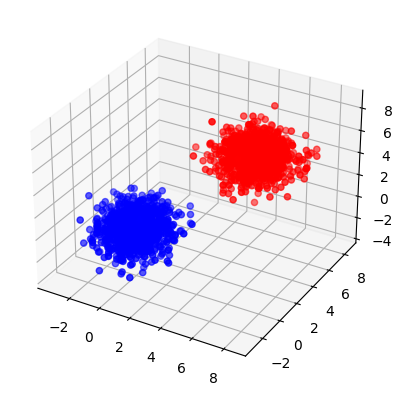

In [8]:
def plot_test_clusters(data, labels):
    clusters = {}
    for i, prev_label in enumerate(labels):
        if prev_label not in clusters:
            clusters[prev_label] = []
        else:
            clusters[prev_label].append(data[i])

    xs = {}
    ys = {}
    zs = {}
    for prev_label in clusters:
        xs[prev_label] = [point[0] for point in clusters[prev_label]]
        ys[prev_label] = [point[1] for point in clusters[prev_label]]
        zs[prev_label] = [point[2] for point in clusters[prev_label]]

    ax = plt.axes(projection="3d")
    ax.scatter(xs[0], ys[0], zs[0], color="blue")
    ax.scatter(xs[1], ys[1], zs[1], color="red")
    plt.show()


plot_test_clusters(data, labels)

## Meanshift algorithm (with speed-ups)


Define _findpeak_opt_ function


In [9]:
def findpeak_opt(data: np.ndarray, idx, r, c):
    data_num = len(data)
    cpts = np.zeros((data_num,))
    center = data[idx]

    while True:
        # SPEEDUP 2
        # Collect points within distance r/c from the search path
        cpts[np.linalg.norm(data - center, axis=1) <= r / c] = 1

        # Collect points within radius
        points = data[np.linalg.norm(data - center, axis=1) <= r]

        # Compute mean of points within radius
        mean = np.mean(points, axis=0)

        # Check if shift > THRESHOLD
        if np.linalg.norm(center - mean) > THRESHOLD:
            center = mean
        else:
            break

    return center, cpts

Define _meanshift_opt_ function


In [10]:
def meanshift_opt(data: np.ndarray, r, c):
    data_num = len(data)
    labels = np.zeros((data_num,)) - 1
    peaks = []

    pbar = tqdm(total=data_num)
    labeled_num = 0
    while True:
        i = np.argmax(labels < 0)
        peak, cpts = findpeak_opt(data, i, r, c)

        labeled = False
        for prev_label, prev_peak in enumerate(peaks):
            if np.linalg.norm(peak - prev_peak) <= r / 2:
                label = prev_label
                peak = prev_peak
                labeled = True
                break

        if not labeled:
            label = len(peaks)
            peaks.append(peak)

        # Change label of i'th data point
        labels[i] = label

        # SPEEDUP 1
        # Change the label of points within a distance of r from the peak
        labels[np.linalg.norm(data - peak, axis=1) <= r] = label

        # SPEEDUP 2
        # Change the label of points within a distance of r/c from the search path
        labels[cpts > 0] = label

        # Update progress bar
        new_labeled_num = np.sum(labels >= 0)
        pbar.update(new_labeled_num - labeled_num)
        labeled_num = new_labeled_num

        # Check if all data has been labelled
        if labeled_num == data_num:
            break

    return labels, peaks

Apply the sped up meanshift algorithm on test data


In [11]:
start = time.time()
labels, peaks = meanshift_opt(data, 2, 4)
end = time.time()

print("Labels:", np.unique(labels))
print("Peaks:", peaks)
print(f"Total time: {end - start:0.2f}s")

  0%|          | 0/2000 [00:00<?, ?it/s]

Labels: [0. 1.]
Peaks: [array([-0.06756875,  0.04788814,  0.02778451]), array([5.04987186, 4.98116882, 5.0104074 ])]
Total time: 1.53s


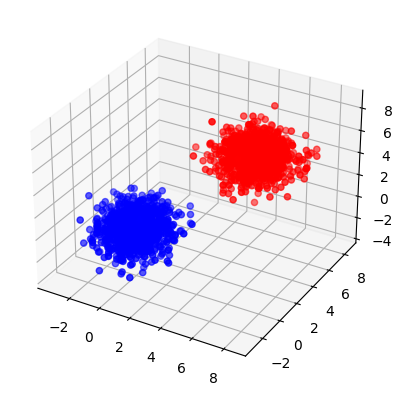

In [12]:
plot_test_clusters(data, labels)

# Image Segmentation


## Imports


In [13]:
import cv2
from matplotlib import cm
from matplotlib.colors import ListedColormap

## Pre-processing


Load the image in CIELAB color format


In [14]:
def load_image_lab(path):
    image_bgr = np.float32(cv2.imread(path)) / 255
    image_lab = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2LAB)

    return image_lab

Create 3D/5D feature arrays from images


In [15]:
def image_to_3d_vector(image: np.ndarray):
    h, w, c = image.shape
    vec_image = image.reshape((h * w, c))

    return vec_image


def image_to_5d_vector(image: np.ndarray):
    h, w, c = image.shape
    vec_image = image.reshape((h * w, c))
    coords = np.array([[(i, j) for j in range(w)] for i in range(h)]).reshape(
        (h * w, 2)
    )
    vec_image_xy = np.hstack((vec_image, coords))

    return vec_image_xy

## The segmentation algorithm


Increase the threshold


In [16]:
THRESHOLD = 1

In [17]:
def segmIm(path, vectorize_fun, r, c, verbose=False):
    """
    A function that uses the meanshift algorithm to perform image segmentation.
    """
    image = load_image_lab(path)
    vec_image = vectorize_fun(image)
    labels, peaks = meanshift_opt(vec_image, r, c)

    # Print results
    if verbose:
        print(f"##### Segmentation results for {path} #####")
        print()
        print(
            f"Parameters: {vectorize_fun.__name__[9:11].upper()} feature vector, r = {r}, c = {c}"
        )
        print()
        print("------------------------------------------------")
        print()
        print("Number of clusters found:", len(peaks))
        print()
        print("Labels -> Peaks:")
        for i, peak in enumerate(peaks):
            print(
                f"{str(i).rjust(6)} -> [ {'  '.join(f'{x:0.3f}'.rjust(8) for x in peak)} ]"
            )

    return labels, peaks

## Visualising the results of segmentation


In [18]:
def segm_image_peaks(
    im_shape: tuple, labels: np.ndarray, peaks: list[np.ndarray], save_as=None
):
    """
    A function to color each pixel according to the peak of its associated cluster.
    """
    # Reshape labels to the shape of the original image
    labels = labels.reshape(im_shape)

    # Convert the CIELAB peaks to RGB colors
    colors_lab = np.float32([[peak[:3]] for peak in peaks])
    colors = cv2.cvtColor(colors_lab, cv2.COLOR_LAB2RGB)

    # Create colormap
    cmap = ListedColormap(colors)

    # Create and plot segmented image
    labels_num = len(peaks)
    if labels_num > 1:
        labels /= np.max(labels)
    rgb_image = cmap(labels)
    plt.imshow(rgb_image)
    plt.axis("off")

    if save_as:
        plt.savefig(save_as, bbox_inches="tight")

    plt.show()


def segm_image_clusters(
    im_shape: tuple, labels: np.ndarray, peaks: list[np.ndarray], save_as=None
):
    """
    A function to better visualise the distinct clusters (helpful in the case
    of 5D features).
    """
    # Reshape labels to the shape of the original image
    labels = labels.reshape(im_shape)

    # Create colormap
    labels_num = len(peaks)
    cmap = cm.get_cmap("Greys", labels_num)

    # Create and plot segmented image
    if labels_num > 1:
        labels /= np.max(labels)
    rgb_image = cmap(labels)
    plt.imshow(rgb_image)
    plt.axis("off")

    if save_as:
        plt.savefig(save_as, bbox_inches="tight")

    plt.show()

## Testing on an example image


Load the image


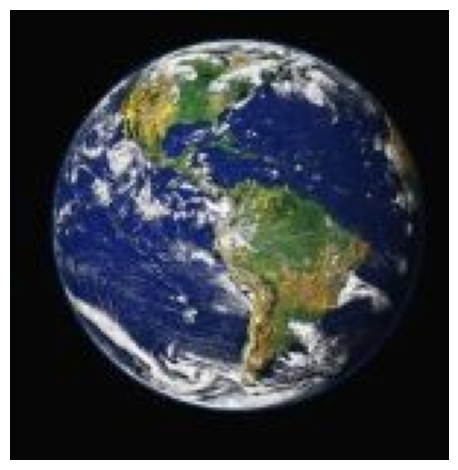

In [19]:
image = "earth.jpg"
path = f"images/{image}"
image_lab = load_image_lab(path)
h, w, _ = image_lab.shape

image_rgb = cv2.cvtColor(image_lab, cv2.COLOR_LAB2RGB)
plt.imshow(image_rgb)
plt.axis("off")
plt.tight_layout()
plt.show()

Test parameters (r, c)


In [20]:
r = 20
c = 4

Perform segmentation (3D feature vectors)


In [21]:
start = time.time()
labels_3d, peaks_3d = segmIm(path, image_to_3d_vector, r=r, c=c, verbose=True)
end = time.time()

print()
print("------------------------------------------------")
print()
print(f"Total time: {end - start:0.2f}s")

  0%|          | 0/23100 [00:00<?, ?it/s]

##### Segmentation results for images/earth.jpg #####

Parameters: 3D feature vector, r = 20, c = 4

------------------------------------------------

Number of clusters found: 6

Labels -> Peaks:
     0 -> [    2.960     0.184    -1.314 ]
     1 -> [   17.955     9.285   -24.850 ]
     2 -> [   43.878     0.574    -7.986 ]
     3 -> [   65.226    -0.863    -2.406 ]
     4 -> [   75.599    -0.671    -2.115 ]
     5 -> [   46.296   -10.063    20.777 ]

------------------------------------------------

Total time: 2.10s


Plot and save the segmented image


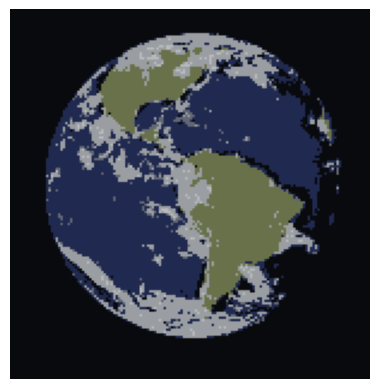

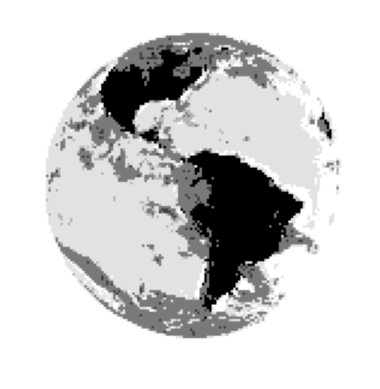

In [22]:
segm_image_peaks(
    (h, w), labels_3d, peaks_3d, save_as=f"results/test/{image}_3D_r={r}_c={c}.jpg"
)
segm_image_clusters(
    (h, w),
    labels_3d,
    peaks_3d,
    save_as=f"results/test/{image}_3D_clusters_r={r}_c={c}.jpg",
)

Perform segmentation (5D feature vectors)


In [23]:
start = time.time()
labels_5d, peaks_5d = segmIm(path, image_to_5d_vector, r=r, c=c, verbose=True)
end = time.time()

print()
print("------------------------------------------------")
print()
print(f"Total time: {end - start:0.2f}s")

  0%|          | 0/23100 [00:00<?, ?it/s]

##### Segmentation results for images/earth.jpg #####

Parameters: 5D feature vector, r = 20, c = 4

------------------------------------------------

Number of clusters found: 68

Labels -> Peaks:
     0 -> [    1.918    -0.026     0.039    16.901    16.838 ]
     1 -> [    2.170    -0.329    -0.414     4.636    75.795 ]
     2 -> [    2.029    -0.032    -0.280    14.824   130.146 ]
     3 -> [   45.896    -2.060    -2.243    19.281    88.136 ]
     4 -> [   40.594    -0.538    -4.744    21.668    99.444 ]
     5 -> [   53.571    -6.385     6.966    20.095    72.582 ]
     6 -> [   70.076    -4.041     3.263    17.711    72.934 ]
     7 -> [   76.190    -2.248    -0.142    18.669    83.869 ]
     8 -> [   27.565    -1.986    -2.820    14.432    61.514 ]
     9 -> [   78.750    -4.185     3.750    18.479    65.665 ]
    10 -> [   67.009    -0.635    -2.820    20.394    95.076 ]
    11 -> [   43.799   -16.102    16.171    27.399    66.032 ]
    12 -> [   12.563    10.180   -25.787    51

Plot and save the segmented image


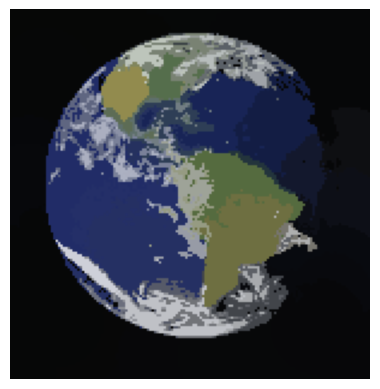

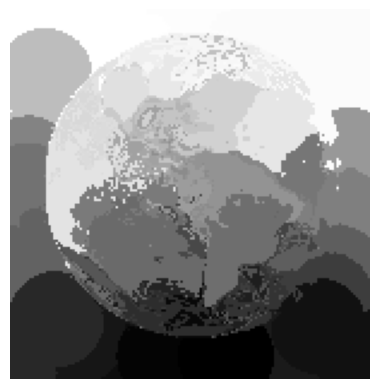

In [24]:
segm_image_peaks(
    (h, w), labels_5d, peaks_5d, save_as=f"results/test/{image}_5D_r={r}_c={c}.jpg"
)
segm_image_clusters(
    (h, w),
    labels_5d,
    peaks_5d,
    save_as=f"results/test/{image}_5D_clusters_r={r}_c={c}.jpg",
)

# Experiments


Images to be tested (at 75% of original height and width)


In [25]:
IMAGES = ("55075_75.jpg", "181091_75.jpg", "368078_75.jpg")

Test parameters (r, c)


In [26]:
R = (8, 12, 16, 24)
C = (2, 3, 4, 5)

## 3D feature vectors


In [27]:
results_3d = {
    image: {r: {c: {"labels": None, "peaks": None, "time": None} for c in C} for r in R}
    for image in IMAGES
}

for image in IMAGES:
    for r in R:
        for c in C:
            print(f"{image}, 3D, r={r}, c={c}")
            path = "images/" + image

            # Perform and time segmentation
            start = time.time()
            labels, peaks = segmIm(path, image_to_3d_vector, r, c)
            end = time.time()

            print("Clusters found:", len(peaks))
            print(f"Total time: {end - start:0.2f}s")
            print()

            # Save the results
            results_3d[image][r][c]["labels"] = labels
            results_3d[image][r][c]["peaks"] = peaks
            results_3d[image][r][c]["time"] = end - start

55075_75.jpg, 3D, r=8, c=2


  0%|          | 0/87001 [00:00<?, ?it/s]

Clusters found: 26
Total time: 16.76s

55075_75.jpg, 3D, r=8, c=3


  0%|          | 0/87001 [00:00<?, ?it/s]

Clusters found: 26
Total time: 39.05s

55075_75.jpg, 3D, r=8, c=4


  0%|          | 0/87001 [00:00<?, ?it/s]

Clusters found: 27
Total time: 60.75s

55075_75.jpg, 3D, r=8, c=5


  0%|          | 0/87001 [00:00<?, ?it/s]

Clusters found: 27
Total time: 89.36s

55075_75.jpg, 3D, r=12, c=2


  0%|          | 0/87001 [00:00<?, ?it/s]

Clusters found: 6
Total time: 5.82s

55075_75.jpg, 3D, r=12, c=3


  0%|          | 0/87001 [00:00<?, ?it/s]

Clusters found: 7
Total time: 13.36s

55075_75.jpg, 3D, r=12, c=4


  0%|          | 0/87001 [00:00<?, ?it/s]

Clusters found: 8
Total time: 23.34s

55075_75.jpg, 3D, r=12, c=5


  0%|          | 0/87001 [00:00<?, ?it/s]

Clusters found: 8
Total time: 30.51s

55075_75.jpg, 3D, r=16, c=2


  0%|          | 0/87001 [00:00<?, ?it/s]

Clusters found: 4
Total time: 2.95s

55075_75.jpg, 3D, r=16, c=3


  0%|          | 0/87001 [00:00<?, ?it/s]

Clusters found: 5
Total time: 6.76s

55075_75.jpg, 3D, r=16, c=4


  0%|          | 0/87001 [00:00<?, ?it/s]

Clusters found: 5
Total time: 11.85s

55075_75.jpg, 3D, r=16, c=5


  0%|          | 0/87001 [00:00<?, ?it/s]

Clusters found: 5
Total time: 19.26s

55075_75.jpg, 3D, r=24, c=2


  0%|          | 0/87001 [00:00<?, ?it/s]

Clusters found: 3
Total time: 0.79s

55075_75.jpg, 3D, r=24, c=3


  0%|          | 0/87001 [00:00<?, ?it/s]

Clusters found: 3
Total time: 1.45s

55075_75.jpg, 3D, r=24, c=4


  0%|          | 0/87001 [00:00<?, ?it/s]

Clusters found: 3
Total time: 2.72s

55075_75.jpg, 3D, r=24, c=5


  0%|          | 0/87001 [00:00<?, ?it/s]

Clusters found: 3
Total time: 3.68s

181091_75.jpg, 3D, r=8, c=2


  0%|          | 0/87001 [00:00<?, ?it/s]

Clusters found: 59
Total time: 25.16s

181091_75.jpg, 3D, r=8, c=3


  0%|          | 0/87001 [00:00<?, ?it/s]

Clusters found: 64
Total time: 48.20s

181091_75.jpg, 3D, r=8, c=4


  0%|          | 0/87001 [00:00<?, ?it/s]

Clusters found: 67
Total time: 73.46s

181091_75.jpg, 3D, r=8, c=5


  0%|          | 0/87001 [00:00<?, ?it/s]

Clusters found: 69
Total time: 100.84s

181091_75.jpg, 3D, r=12, c=2


  0%|          | 0/87001 [00:00<?, ?it/s]

Clusters found: 9
Total time: 12.20s

181091_75.jpg, 3D, r=12, c=3


  0%|          | 0/87001 [00:00<?, ?it/s]

Clusters found: 10
Total time: 25.20s

181091_75.jpg, 3D, r=12, c=4


  0%|          | 0/87001 [00:00<?, ?it/s]

Clusters found: 11
Total time: 43.26s

181091_75.jpg, 3D, r=12, c=5


  0%|          | 0/87001 [00:00<?, ?it/s]

Clusters found: 12
Total time: 67.91s

181091_75.jpg, 3D, r=16, c=2


  0%|          | 0/87001 [00:00<?, ?it/s]

Clusters found: 7
Total time: 4.03s

181091_75.jpg, 3D, r=16, c=3


  0%|          | 0/87001 [00:00<?, ?it/s]

Clusters found: 6
Total time: 10.93s

181091_75.jpg, 3D, r=16, c=4


  0%|          | 0/87001 [00:00<?, ?it/s]

Clusters found: 7
Total time: 18.42s

181091_75.jpg, 3D, r=16, c=5


  0%|          | 0/87001 [00:00<?, ?it/s]

Clusters found: 7
Total time: 26.71s

181091_75.jpg, 3D, r=24, c=2


  0%|          | 0/87001 [00:00<?, ?it/s]

Clusters found: 3
Total time: 1.34s

181091_75.jpg, 3D, r=24, c=3


  0%|          | 0/87001 [00:00<?, ?it/s]

Clusters found: 4
Total time: 2.20s

181091_75.jpg, 3D, r=24, c=4


  0%|          | 0/87001 [00:00<?, ?it/s]

Clusters found: 4
Total time: 3.97s

181091_75.jpg, 3D, r=24, c=5


  0%|          | 0/87001 [00:00<?, ?it/s]

Clusters found: 4
Total time: 7.08s

368078_75.jpg, 3D, r=8, c=2


  0%|          | 0/87001 [00:00<?, ?it/s]

Clusters found: 99
Total time: 24.13s

368078_75.jpg, 3D, r=8, c=3


  0%|          | 0/87001 [00:00<?, ?it/s]

Clusters found: 106
Total time: 42.19s

368078_75.jpg, 3D, r=8, c=4


  0%|          | 0/87001 [00:00<?, ?it/s]

Clusters found: 113
Total time: 62.59s

368078_75.jpg, 3D, r=8, c=5


  0%|          | 0/87001 [00:00<?, ?it/s]

Clusters found: 114
Total time: 81.34s

368078_75.jpg, 3D, r=12, c=2


  0%|          | 0/87001 [00:00<?, ?it/s]

Clusters found: 16
Total time: 18.32s

368078_75.jpg, 3D, r=12, c=3


  0%|          | 0/87001 [00:00<?, ?it/s]

Clusters found: 18
Total time: 41.79s

368078_75.jpg, 3D, r=12, c=4


  0%|          | 0/87001 [00:00<?, ?it/s]

Clusters found: 19
Total time: 67.28s

368078_75.jpg, 3D, r=12, c=5


  0%|          | 0/87001 [00:00<?, ?it/s]

Clusters found: 20
Total time: 87.16s

368078_75.jpg, 3D, r=16, c=2


  0%|          | 0/87001 [00:00<?, ?it/s]

Clusters found: 7
Total time: 7.21s

368078_75.jpg, 3D, r=16, c=3


  0%|          | 0/87001 [00:00<?, ?it/s]

Clusters found: 8
Total time: 19.00s

368078_75.jpg, 3D, r=16, c=4


  0%|          | 0/87001 [00:00<?, ?it/s]

Clusters found: 9
Total time: 32.65s

368078_75.jpg, 3D, r=16, c=5


  0%|          | 0/87001 [00:00<?, ?it/s]

Clusters found: 9
Total time: 42.36s

368078_75.jpg, 3D, r=24, c=2


  0%|          | 0/87001 [00:00<?, ?it/s]

Clusters found: 3
Total time: 2.48s

368078_75.jpg, 3D, r=24, c=3


  0%|          | 0/87001 [00:00<?, ?it/s]

Clusters found: 4
Total time: 5.90s

368078_75.jpg, 3D, r=24, c=4


  0%|          | 0/87001 [00:00<?, ?it/s]

Clusters found: 4
Total time: 10.46s

368078_75.jpg, 3D, r=24, c=5


  0%|          | 0/87001 [00:00<?, ?it/s]

Clusters found: 4
Total time: 16.26s



Save the results


In [28]:
np.save("results/arrays/results_3d.npy", results_3d)

Load the results


In [29]:
results_3d = np.load("results/arrays/results_3d.npy", allow_pickle=True).item()

Plot and save the segmented images


55075_75.jpg, 3D, r=8, c=2
Clusters found: 26


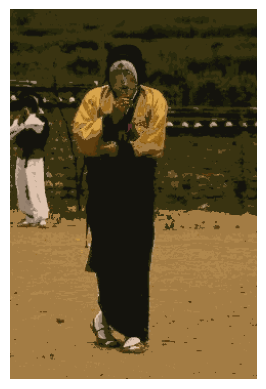

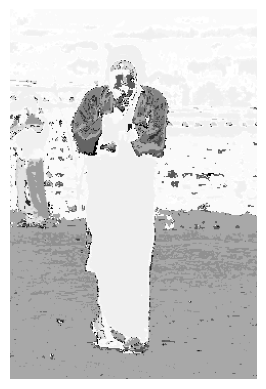

55075_75.jpg, 3D, r=8, c=3
Clusters found: 26


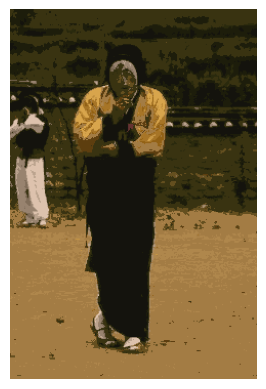

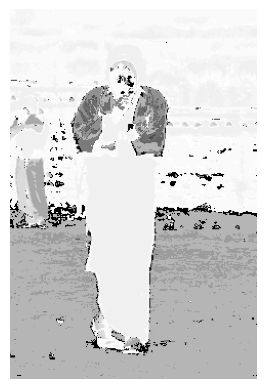

55075_75.jpg, 3D, r=8, c=4
Clusters found: 27


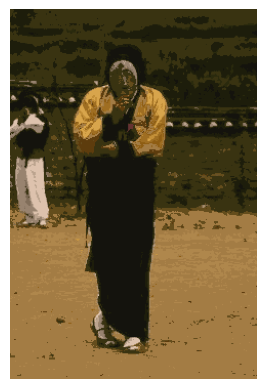

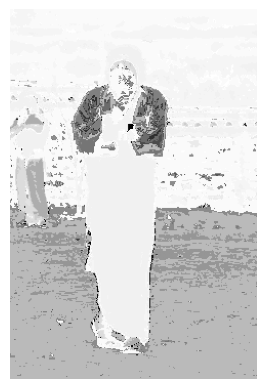

55075_75.jpg, 3D, r=8, c=5
Clusters found: 27


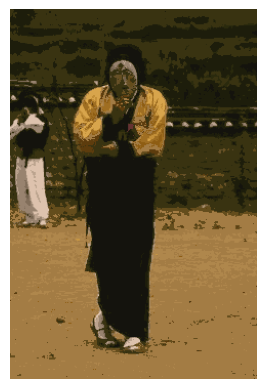

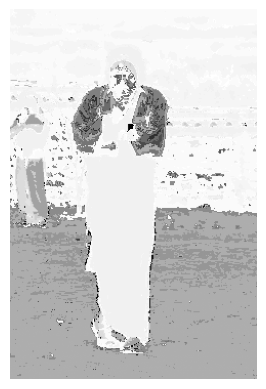

55075_75.jpg, 3D, r=12, c=2
Clusters found: 6


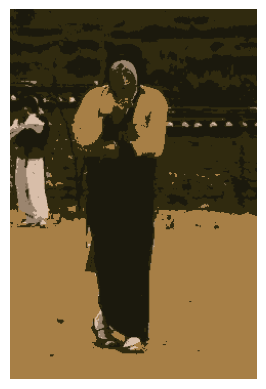

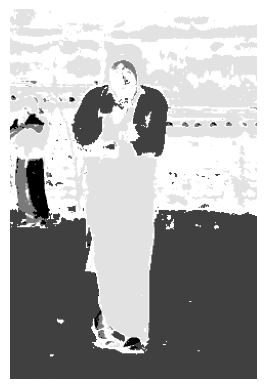

55075_75.jpg, 3D, r=12, c=3
Clusters found: 7


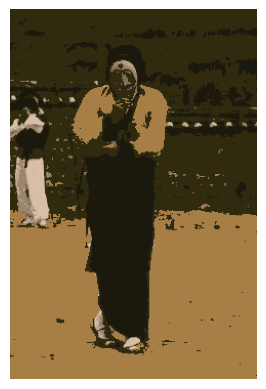

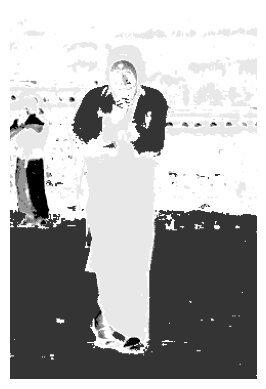

55075_75.jpg, 3D, r=12, c=4
Clusters found: 8


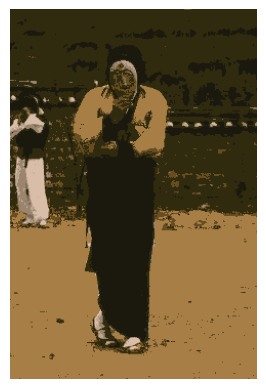

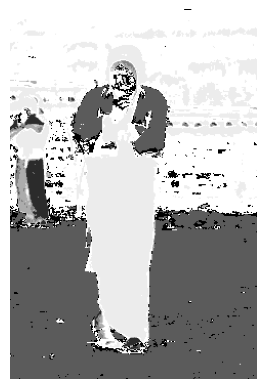

55075_75.jpg, 3D, r=12, c=5
Clusters found: 8


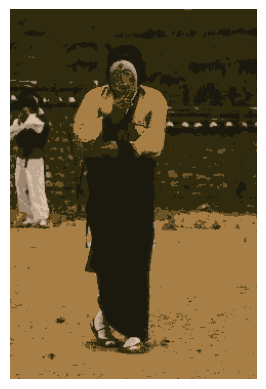

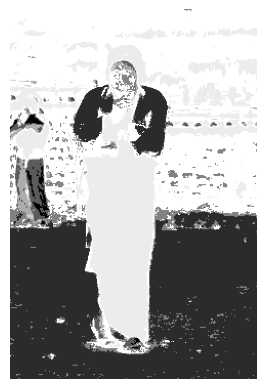

55075_75.jpg, 3D, r=16, c=2
Clusters found: 4


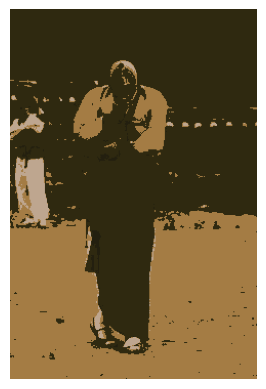

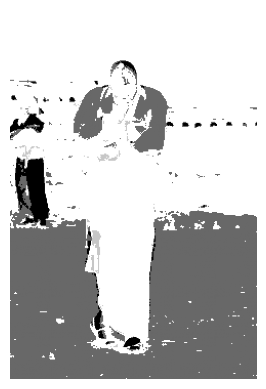

55075_75.jpg, 3D, r=16, c=3
Clusters found: 5


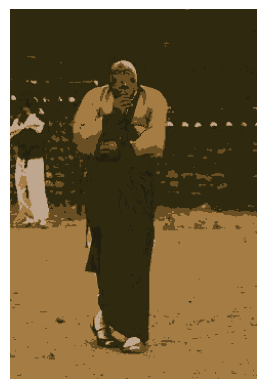

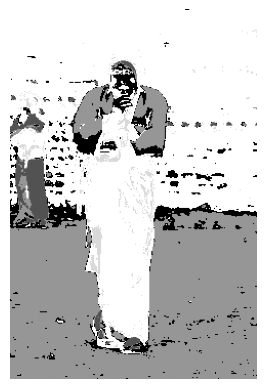

55075_75.jpg, 3D, r=16, c=4
Clusters found: 5


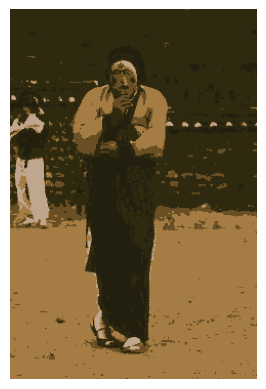

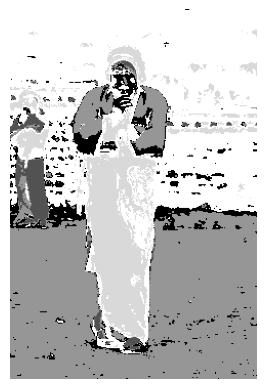

55075_75.jpg, 3D, r=16, c=5
Clusters found: 5


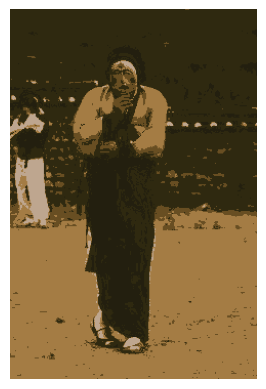

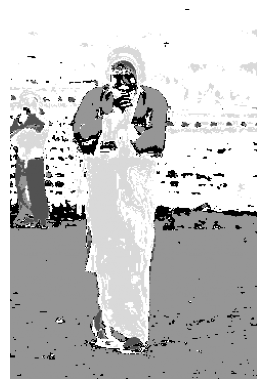

55075_75.jpg, 3D, r=24, c=2
Clusters found: 3


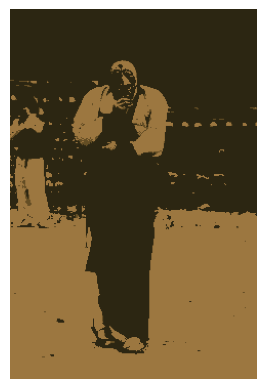

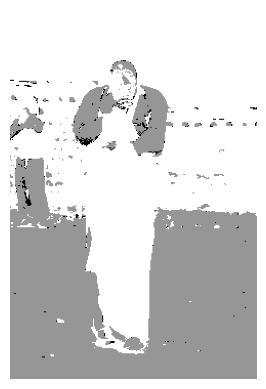

55075_75.jpg, 3D, r=24, c=3
Clusters found: 3


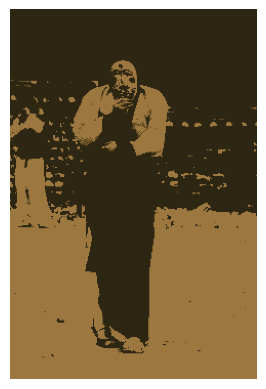

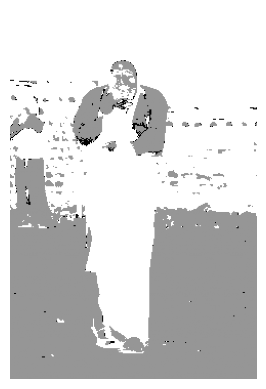

55075_75.jpg, 3D, r=24, c=4
Clusters found: 3


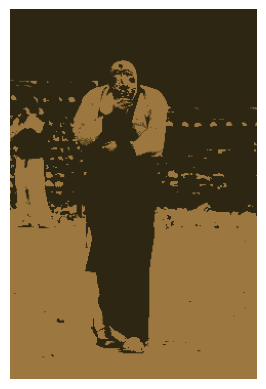

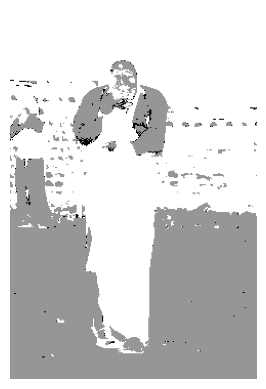

55075_75.jpg, 3D, r=24, c=5
Clusters found: 3


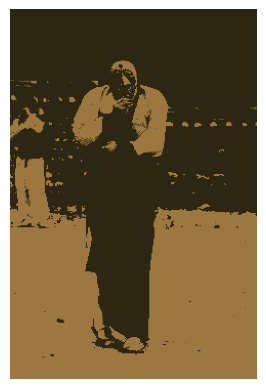

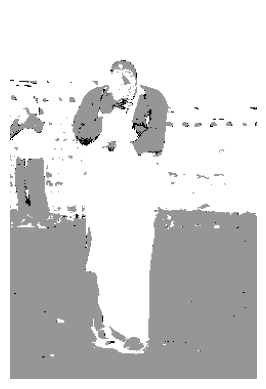

181091_75.jpg, 3D, r=8, c=2
Clusters found: 59


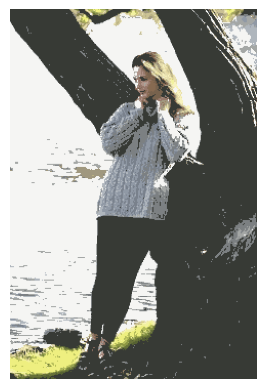

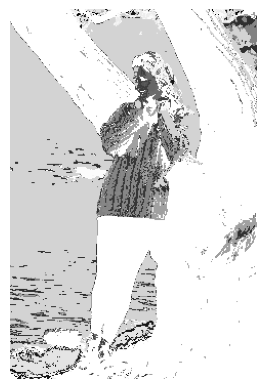

181091_75.jpg, 3D, r=8, c=3
Clusters found: 64


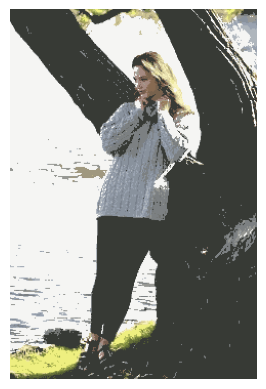

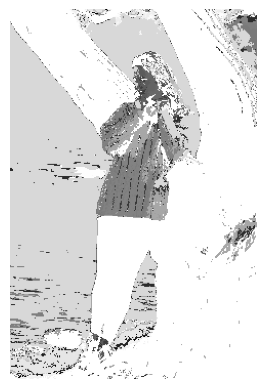

181091_75.jpg, 3D, r=8, c=4
Clusters found: 67


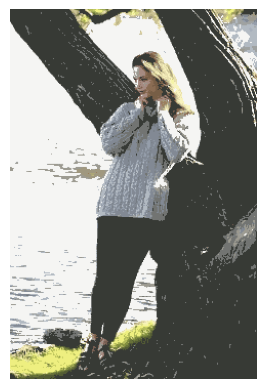

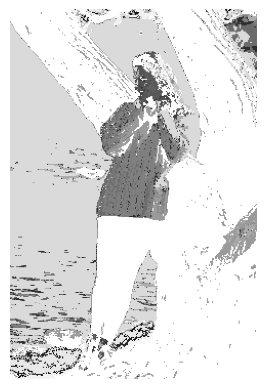

181091_75.jpg, 3D, r=8, c=5
Clusters found: 69


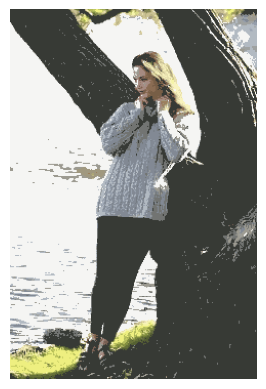

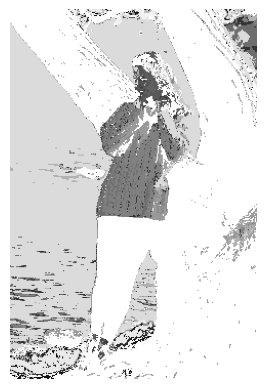

181091_75.jpg, 3D, r=12, c=2
Clusters found: 9


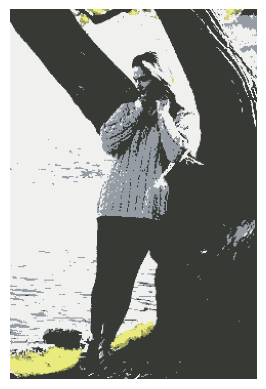

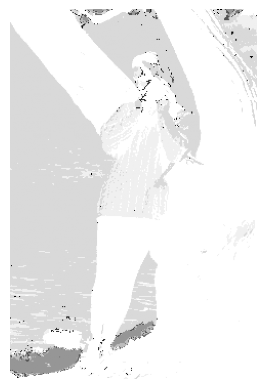

181091_75.jpg, 3D, r=12, c=3
Clusters found: 10


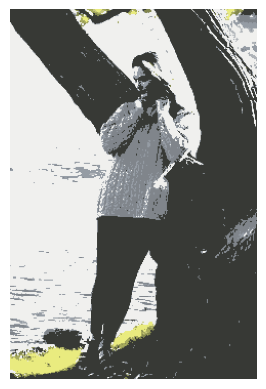

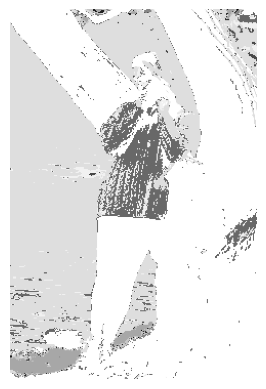

181091_75.jpg, 3D, r=12, c=4
Clusters found: 11


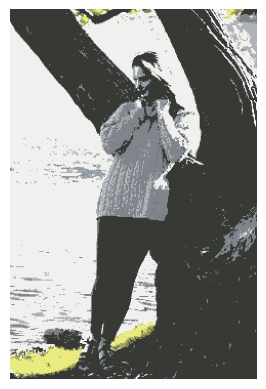

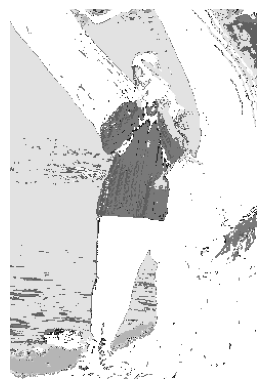

181091_75.jpg, 3D, r=12, c=5
Clusters found: 12


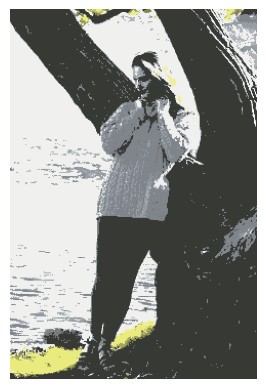

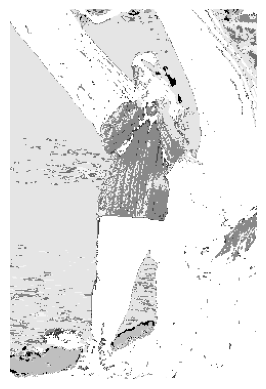

181091_75.jpg, 3D, r=16, c=2
Clusters found: 7


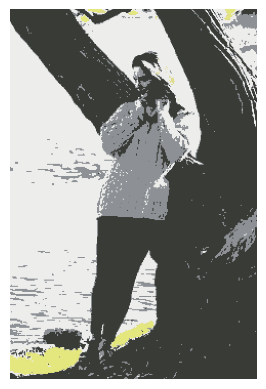

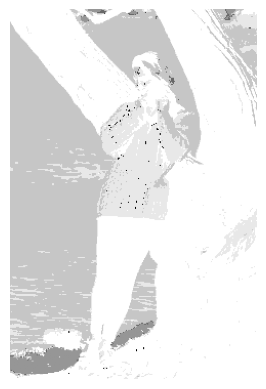

181091_75.jpg, 3D, r=16, c=3
Clusters found: 6


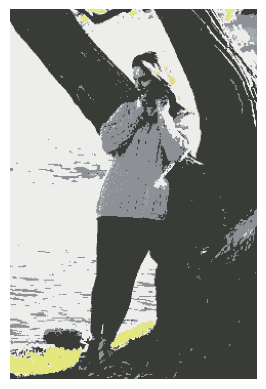

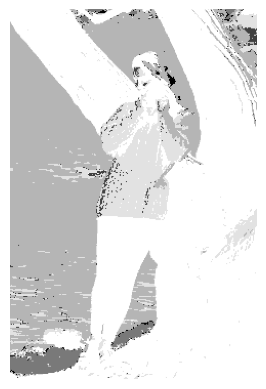

181091_75.jpg, 3D, r=16, c=4
Clusters found: 7


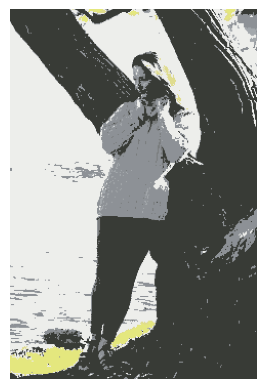

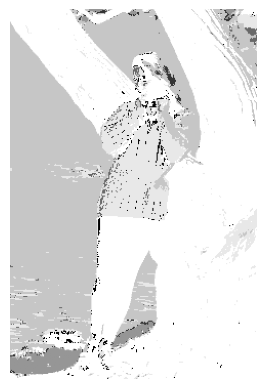

181091_75.jpg, 3D, r=16, c=5
Clusters found: 7


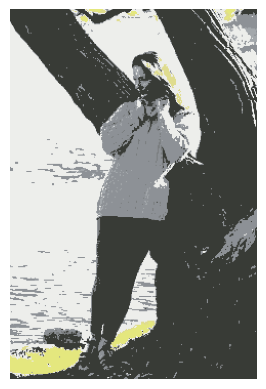

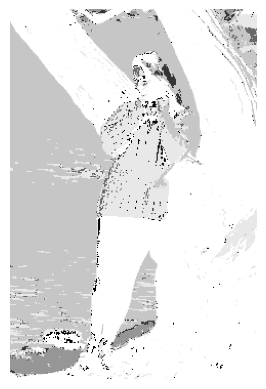

181091_75.jpg, 3D, r=24, c=2
Clusters found: 3


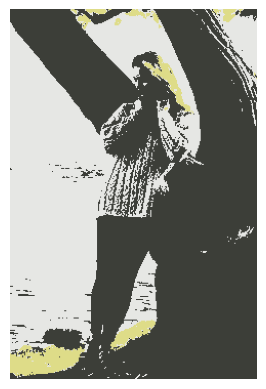

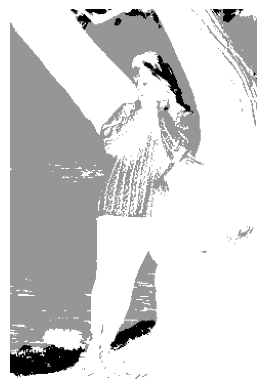

181091_75.jpg, 3D, r=24, c=3
Clusters found: 4


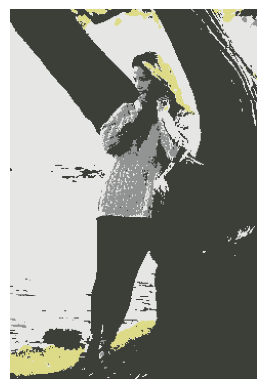

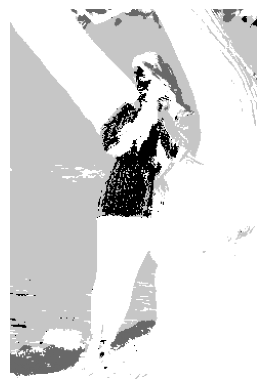

181091_75.jpg, 3D, r=24, c=4
Clusters found: 4


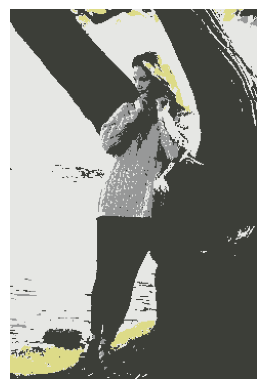

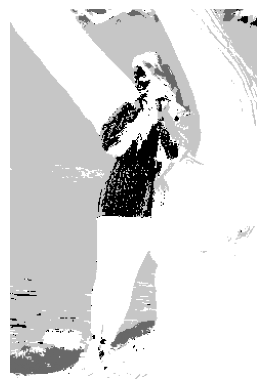

181091_75.jpg, 3D, r=24, c=5
Clusters found: 4


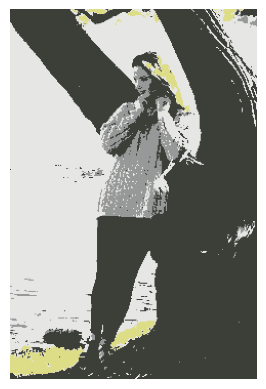

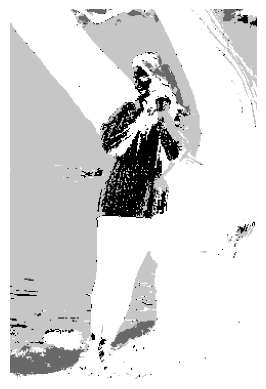

368078_75.jpg, 3D, r=8, c=2
Clusters found: 99


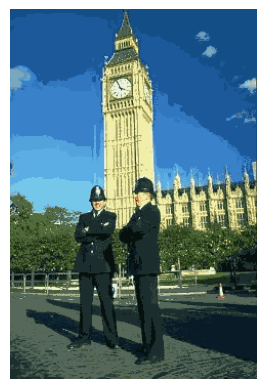

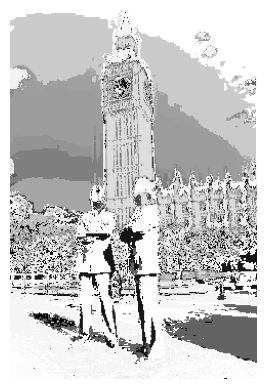

368078_75.jpg, 3D, r=8, c=3
Clusters found: 106


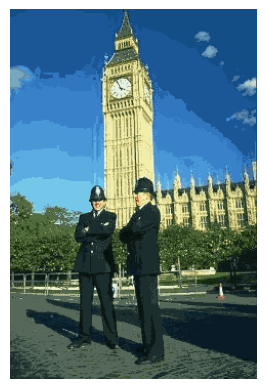

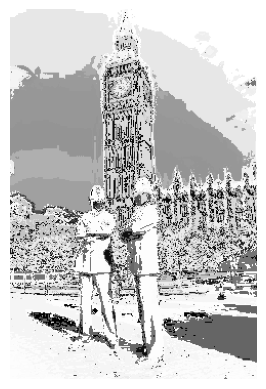

368078_75.jpg, 3D, r=8, c=4
Clusters found: 113


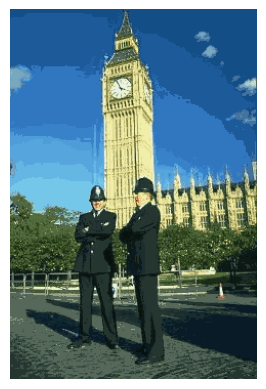

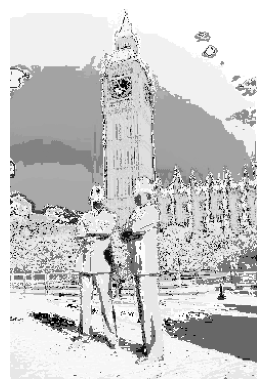

368078_75.jpg, 3D, r=8, c=5
Clusters found: 114


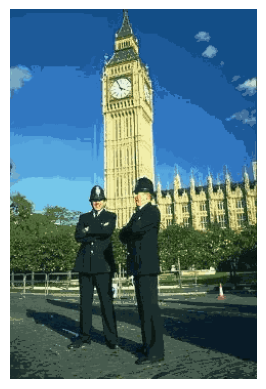

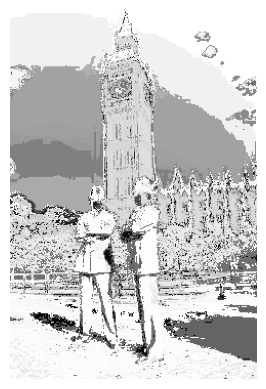

368078_75.jpg, 3D, r=12, c=2
Clusters found: 16


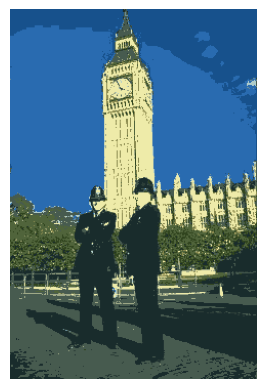

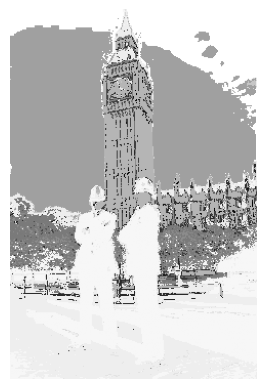

368078_75.jpg, 3D, r=12, c=3
Clusters found: 18


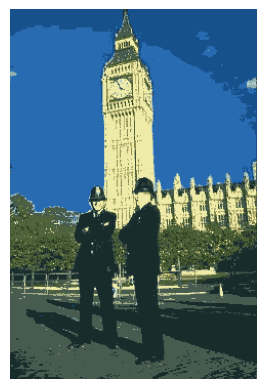

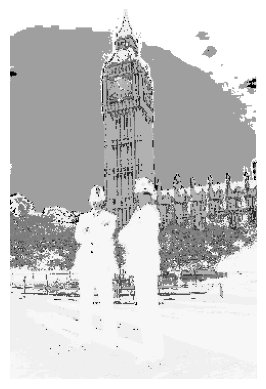

368078_75.jpg, 3D, r=12, c=4
Clusters found: 19


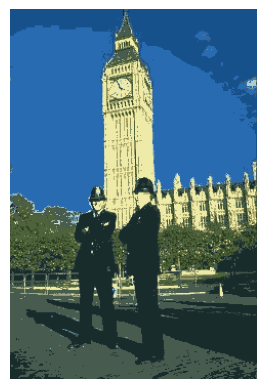

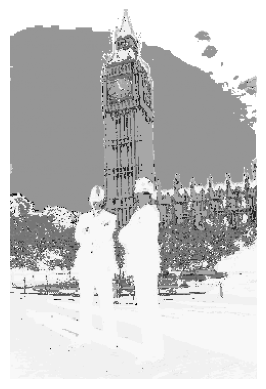

368078_75.jpg, 3D, r=12, c=5
Clusters found: 20


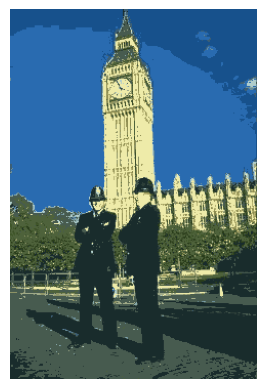

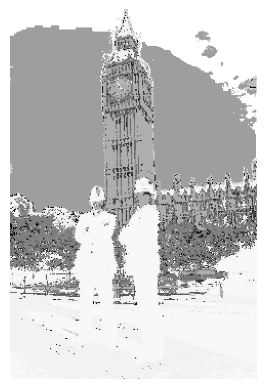

368078_75.jpg, 3D, r=16, c=2
Clusters found: 7


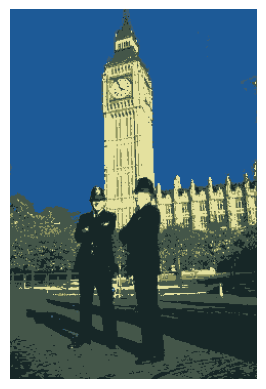

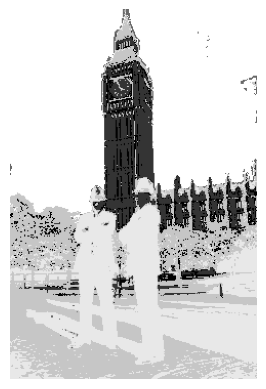

368078_75.jpg, 3D, r=16, c=3
Clusters found: 8


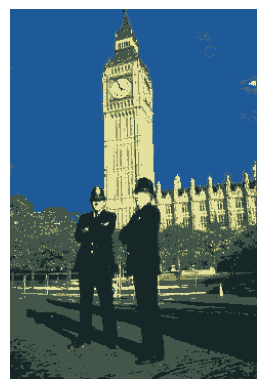

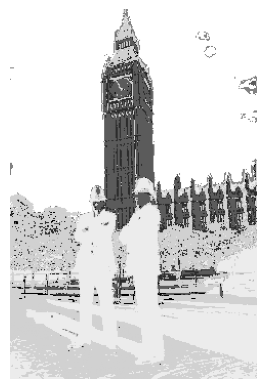

368078_75.jpg, 3D, r=16, c=4
Clusters found: 9


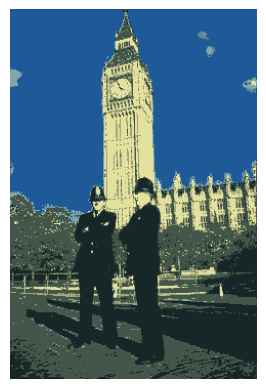

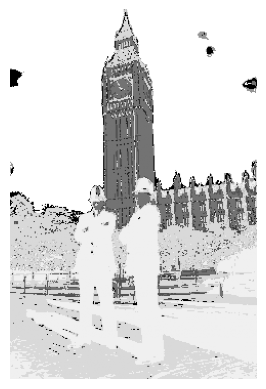

368078_75.jpg, 3D, r=16, c=5
Clusters found: 9


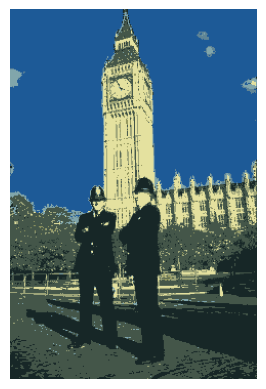

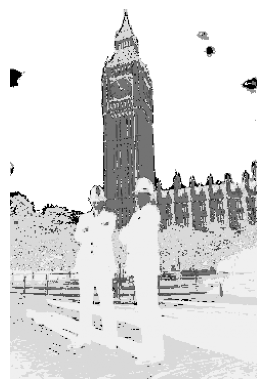

368078_75.jpg, 3D, r=24, c=2
Clusters found: 3


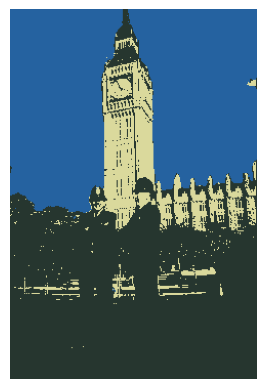

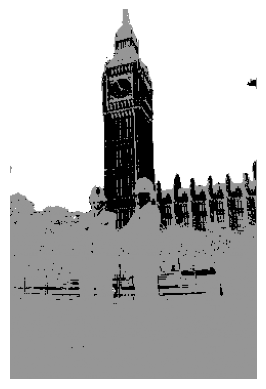

368078_75.jpg, 3D, r=24, c=3
Clusters found: 4


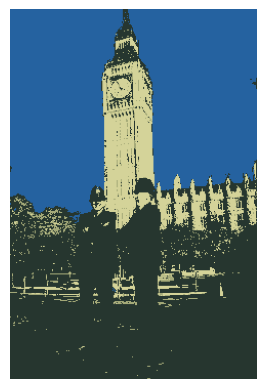

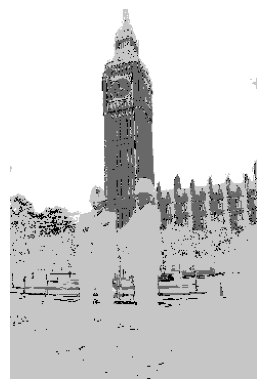

368078_75.jpg, 3D, r=24, c=4
Clusters found: 4


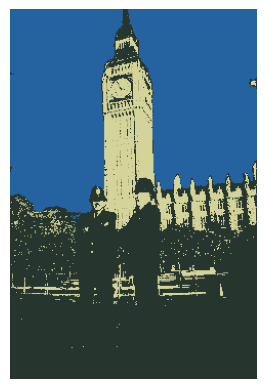

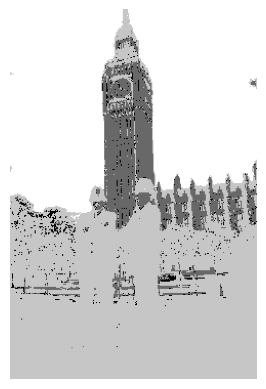

368078_75.jpg, 3D, r=24, c=5
Clusters found: 4


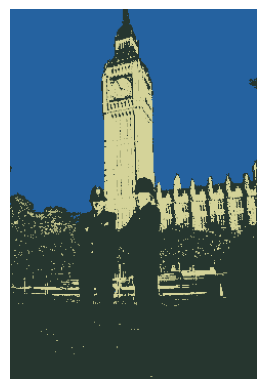

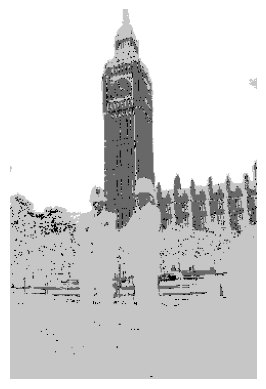

In [30]:
for image in IMAGES:
    for r in R:
        for c in C:
            print(f"{image}, 3D, r={r}, c={c}")
            path = "images/" + image
            h, w, _ = load_image_lab(path).shape
            labels = results_3d[image][r][c]["labels"]
            peaks = results_3d[image][r][c]["peaks"]
            print("Clusters found:", len(peaks))

            # Plot and save peaks
            filename_peaks = f"results/segmented_images/{image}_3D_r={r}_c={c}.jpg"
            segm_image_peaks((h, w), labels, peaks, save_as=filename_peaks)

            # Plot and save clusters
            filename_clusters = (
                f"results/segmented_images/{image}_3D_clusters_r={r}_c={c}.jpg"
            )
            segm_image_clusters((h, w), labels, peaks, save_as=filename_clusters)

Plot number of clusters found and total time against the different values of r, c


In [39]:
def heatmap_clusters_num(results, image, feature_type, save_as=None):
    clusters_num = np.array(
        [[len(results[image][r][c]["peaks"]) for c in C] for r in R]
    )
    fig, ax = plt.subplots()
    ax.imshow(clusters_num)
    ax.set_xticks(np.arange(len(C)), labels=C)
    ax.set_xlabel("Values for c")
    ax.set_yticks(np.arange(len(R)), labels=R)
    ax.set_ylabel("Values for r")
    ax.set_title(f"Number of clusters found for {image} ({feature_type})")
    fig.tight_layout()
    for i in range(len(R)):
        for j in range(len(C)):
            ax.text(j, i, clusters_num[i, j], ha="center", va="center", color="w")

    if save_as:
        plt.savefig(save_as, bbox_inches="tight")

    plt.show()


def heatmap_time(results, image, feature_type, save_as=None):
    time = np.array([[results[image][r][c]["time"] for c in C] for r in R])
    fig, ax = plt.subplots()
    ax.imshow(time)
    ax.set_xticks(np.arange(len(C)), labels=C)
    ax.set_xlabel("Values for c")
    ax.set_yticks(np.arange(len(R)), labels=R)
    ax.set_ylabel("Values for r")
    ax.set_title(f"Time taken to complete segmentation for {image} ({feature_type})")
    fig.tight_layout()
    for i in range(len(R)):
        for j in range(len(C)):
            ax.text(j, i, f"{time[i, j]:0.2f}", ha="center", va="center", color="w")

    if save_as:
        plt.savefig(save_as, bbox_inches="tight")

    plt.show()

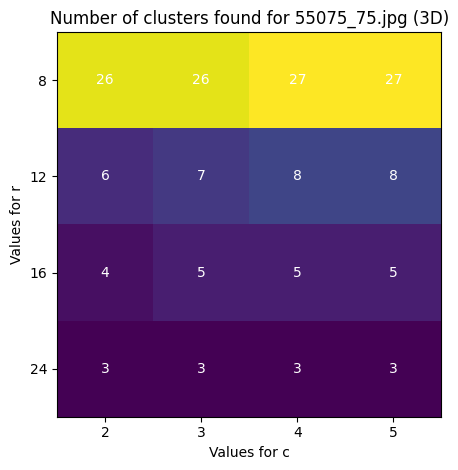

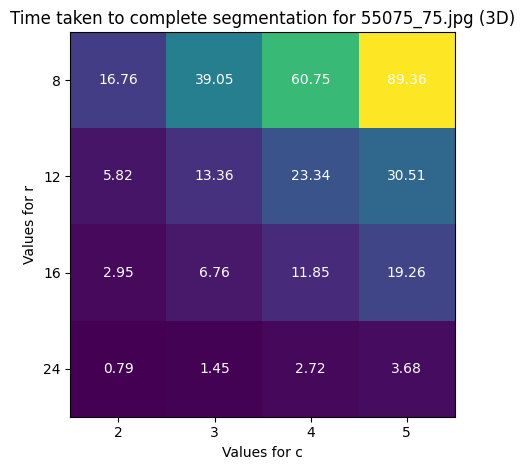

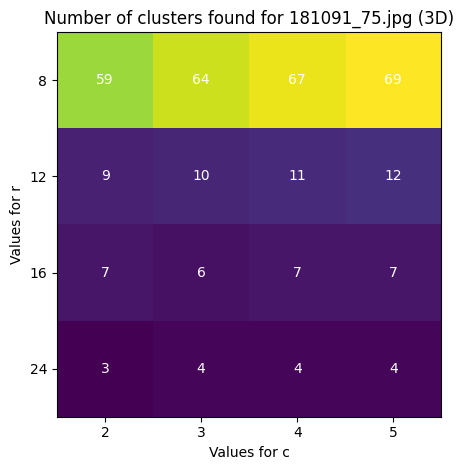

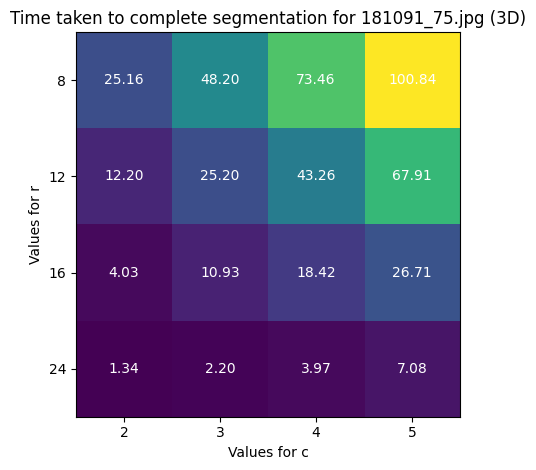

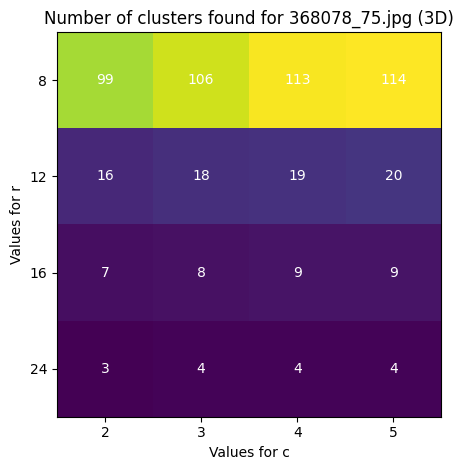

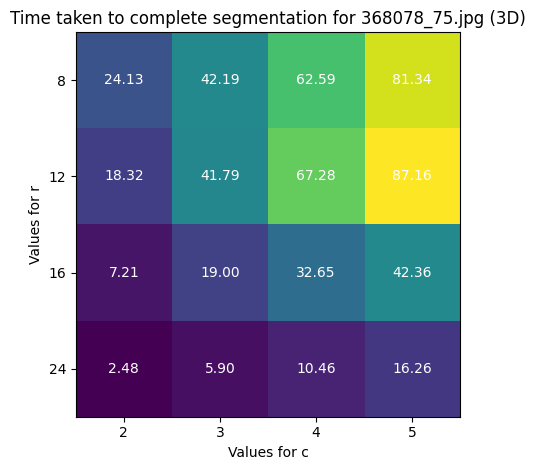

In [40]:
for image in IMAGES:
    heatmap_clusters_num(
        results_3d, image, "3D", save_as=f"results/heatmaps/{image}_3D_clusters_num.jpg"
    )
    heatmap_time(
        results_3d, image, "3D", save_as=f"results/heatmaps/{image}_3D_time.jpg"
    )

## 5D feature vectors


In [33]:
results_5d = {
    image: {r: {c: {"labels": None, "peaks": None, "time": None} for c in C} for r in R}
    for image in IMAGES
}

for image in IMAGES:
    for r in R:
        for c in C:
            print(f"{image}, 5D, r={r}, c={c}")
            path = "images/" + image

            # Perform and time segmentation
            start = time.time()
            labels, peaks = segmIm(path, image_to_5d_vector, r, c)
            end = time.time()

            print("Clusters found:", len(peaks))
            print(f"Total time: {end - start:0.2f}s")
            print()

            # Save the results
            results_5d[image][r][c]["labels"] = labels
            results_5d[image][r][c]["peaks"] = peaks
            results_5d[image][r][c]["time"] = end - start

55075_75.jpg, 5D, r=8, c=2


  0%|          | 0/87001 [00:00<?, ?it/s]

Clusters found: 2733
Total time: 225.01s

55075_75.jpg, 5D, r=8, c=3


  0%|          | 0/87001 [00:00<?, ?it/s]

Clusters found: 2827
Total time: 272.33s

55075_75.jpg, 5D, r=8, c=4


  0%|          | 0/87001 [00:00<?, ?it/s]

Clusters found: 2861
Total time: 307.51s

55075_75.jpg, 5D, r=8, c=5


  0%|          | 0/87001 [00:00<?, ?it/s]

Clusters found: 2874
Total time: 329.67s

55075_75.jpg, 5D, r=12, c=2


  0%|          | 0/87001 [00:00<?, ?it/s]

Clusters found: 870
Total time: 150.80s

55075_75.jpg, 5D, r=12, c=3


  0%|          | 0/87001 [00:00<?, ?it/s]

Clusters found: 910
Total time: 224.01s

55075_75.jpg, 5D, r=12, c=4


  0%|          | 0/87001 [00:00<?, ?it/s]

Clusters found: 938
Total time: 293.94s

55075_75.jpg, 5D, r=12, c=5


  0%|          | 0/87001 [00:00<?, ?it/s]

Clusters found: 951
Total time: 351.89s

55075_75.jpg, 5D, r=16, c=2


  0%|          | 0/87001 [00:00<?, ?it/s]

Clusters found: 403
Total time: 103.02s

55075_75.jpg, 5D, r=16, c=3


  0%|          | 0/87001 [00:00<?, ?it/s]

Clusters found: 431
Total time: 176.37s

55075_75.jpg, 5D, r=16, c=4


  0%|          | 0/87001 [00:00<?, ?it/s]

Clusters found: 452
Total time: 243.02s

55075_75.jpg, 5D, r=16, c=5


  0%|          | 0/87001 [00:00<?, ?it/s]

Clusters found: 451
Total time: 315.55s

55075_75.jpg, 5D, r=24, c=2


  0%|          | 0/87001 [00:00<?, ?it/s]

Clusters found: 151
Total time: 55.30s

55075_75.jpg, 5D, r=24, c=3


  0%|          | 0/87001 [00:00<?, ?it/s]

Clusters found: 163
Total time: 107.25s

55075_75.jpg, 5D, r=24, c=4


  0%|          | 0/87001 [00:00<?, ?it/s]

Clusters found: 168
Total time: 179.77s

55075_75.jpg, 5D, r=24, c=5


  0%|          | 0/87001 [00:00<?, ?it/s]

Clusters found: 168
Total time: 257.77s

181091_75.jpg, 5D, r=8, c=2


  0%|          | 0/87001 [00:00<?, ?it/s]

Clusters found: 3399
Total time: 297.02s

181091_75.jpg, 5D, r=8, c=3


  0%|          | 0/87001 [00:00<?, ?it/s]

Clusters found: 3503
Total time: 344.49s

181091_75.jpg, 5D, r=8, c=4


  0%|          | 0/87001 [00:00<?, ?it/s]

Clusters found: 3546
Total time: 386.12s

181091_75.jpg, 5D, r=8, c=5


  0%|          | 0/87001 [00:00<?, ?it/s]

Clusters found: 3563
Total time: 434.13s

181091_75.jpg, 5D, r=12, c=2


  0%|          | 0/87001 [00:00<?, ?it/s]

Clusters found: 1089
Total time: 207.95s

181091_75.jpg, 5D, r=12, c=3


  0%|          | 0/87001 [00:00<?, ?it/s]

Clusters found: 1128
Total time: 285.23s

181091_75.jpg, 5D, r=12, c=4


  0%|          | 0/87001 [00:00<?, ?it/s]

Clusters found: 1165
Total time: 369.22s

181091_75.jpg, 5D, r=12, c=5


  0%|          | 0/87001 [00:00<?, ?it/s]

Clusters found: 1174
Total time: 430.63s

181091_75.jpg, 5D, r=16, c=2


  0%|          | 0/87001 [00:00<?, ?it/s]

Clusters found: 462
Total time: 140.87s

181091_75.jpg, 5D, r=16, c=3


  0%|          | 0/87001 [00:00<?, ?it/s]

Clusters found: 493
Total time: 247.64s

181091_75.jpg, 5D, r=16, c=4


  0%|          | 0/87001 [00:00<?, ?it/s]

Clusters found: 501
Total time: 352.73s

181091_75.jpg, 5D, r=16, c=5


  0%|          | 0/87001 [00:00<?, ?it/s]

Clusters found: 511
Total time: 448.46s

181091_75.jpg, 5D, r=24, c=2


  0%|          | 0/87001 [00:00<?, ?it/s]

Clusters found: 149
Total time: 80.90s

181091_75.jpg, 5D, r=24, c=3


  0%|          | 0/87001 [00:00<?, ?it/s]

Clusters found: 152
Total time: 167.37s

181091_75.jpg, 5D, r=24, c=4


  0%|          | 0/87001 [00:00<?, ?it/s]

Clusters found: 158
Total time: 269.75s

181091_75.jpg, 5D, r=24, c=5


  0%|          | 0/87001 [00:00<?, ?it/s]

Clusters found: 161
Total time: 384.44s

368078_75.jpg, 5D, r=8, c=2


  0%|          | 0/87001 [00:00<?, ?it/s]

Clusters found: 4281
Total time: 327.26s

368078_75.jpg, 5D, r=8, c=3


  0%|          | 0/87001 [00:00<?, ?it/s]

Clusters found: 4339
Total time: 380.08s

368078_75.jpg, 5D, r=8, c=4


  0%|          | 0/87001 [00:00<?, ?it/s]

Clusters found: 4372
Total time: 413.08s

368078_75.jpg, 5D, r=8, c=5


  0%|          | 0/87001 [00:00<?, ?it/s]

Clusters found: 4383
Total time: 427.36s

368078_75.jpg, 5D, r=12, c=2


  0%|          | 0/87001 [00:00<?, ?it/s]

Clusters found: 1294
Total time: 249.58s

368078_75.jpg, 5D, r=12, c=3


  0%|          | 0/87001 [00:00<?, ?it/s]

Clusters found: 1354
Total time: 359.56s

368078_75.jpg, 5D, r=12, c=4


  0%|          | 0/87001 [00:00<?, ?it/s]

Clusters found: 1374
Total time: 439.78s

368078_75.jpg, 5D, r=12, c=5


  0%|          | 0/87001 [00:00<?, ?it/s]

Clusters found: 1397
Total time: 500.60s

368078_75.jpg, 5D, r=16, c=2


  0%|          | 0/87001 [00:00<?, ?it/s]

Clusters found: 527
Total time: 203.27s

368078_75.jpg, 5D, r=16, c=3


  0%|          | 0/87001 [00:00<?, ?it/s]

Clusters found: 551
Total time: 337.16s

368078_75.jpg, 5D, r=16, c=4


  0%|          | 0/87001 [00:00<?, ?it/s]

Clusters found: 572
Total time: 475.73s

368078_75.jpg, 5D, r=16, c=5


  0%|          | 0/87001 [00:00<?, ?it/s]

Clusters found: 584
Total time: 809.23s

368078_75.jpg, 5D, r=24, c=2


  0%|          | 0/87001 [00:00<?, ?it/s]

Clusters found: 141
Total time: 156.70s

368078_75.jpg, 5D, r=24, c=3


  0%|          | 0/87001 [00:00<?, ?it/s]

Clusters found: 156
Total time: 237.92s

368078_75.jpg, 5D, r=24, c=4


  0%|          | 0/87001 [00:00<?, ?it/s]

Clusters found: 160
Total time: 371.94s

368078_75.jpg, 5D, r=24, c=5


  0%|          | 0/87001 [00:00<?, ?it/s]

Clusters found: 165
Total time: 503.64s



Save the results


In [34]:
np.save("results/arrays/results_5d.npy", results_5d)

Load the results


In [35]:
results_5d = np.load("results/arrays/results_5d.npy", allow_pickle=True).item()

Plot and save the segmented images


55075_75.jpg, 5D, r=8, c=2
Clusters found: 2733


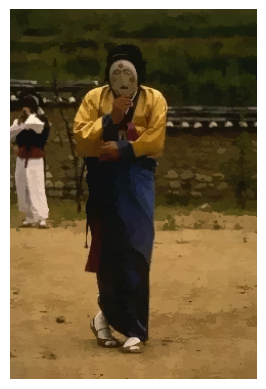

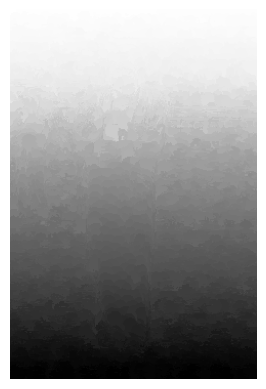

55075_75.jpg, 5D, r=8, c=3
Clusters found: 2827


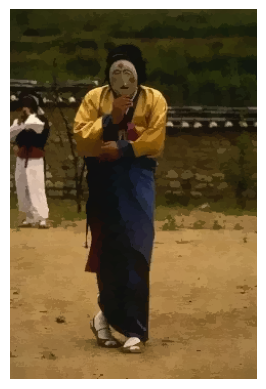

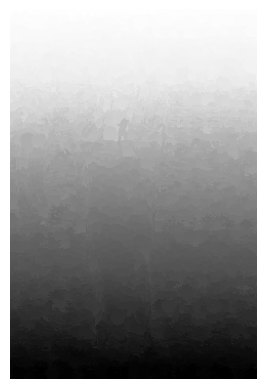

55075_75.jpg, 5D, r=8, c=4
Clusters found: 2861


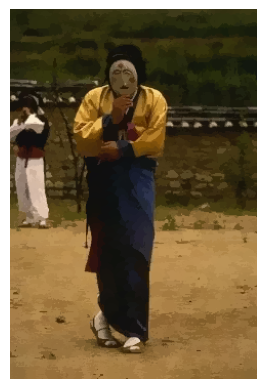

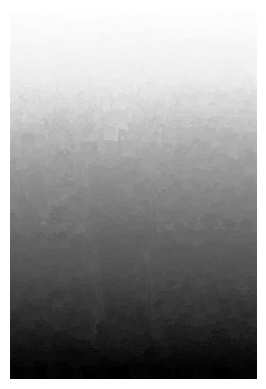

55075_75.jpg, 5D, r=8, c=5
Clusters found: 2874


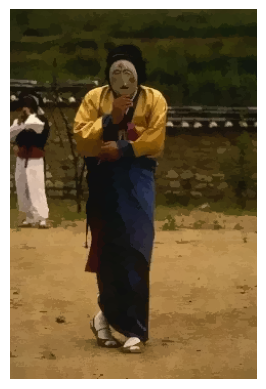

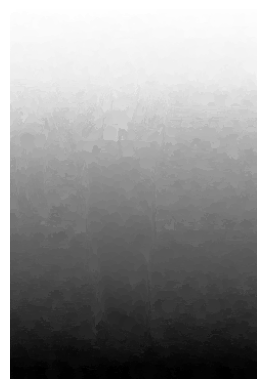

55075_75.jpg, 5D, r=12, c=2
Clusters found: 870


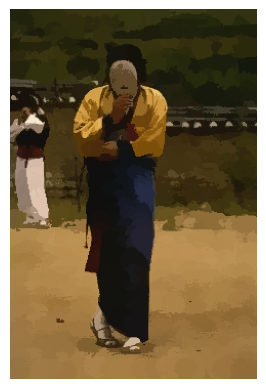

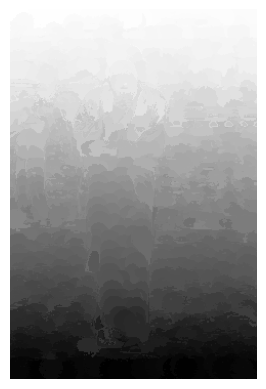

55075_75.jpg, 5D, r=12, c=3
Clusters found: 910


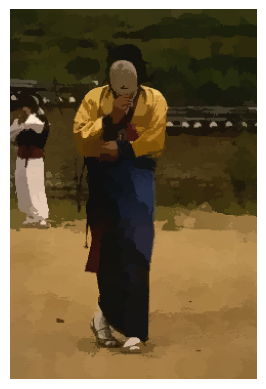

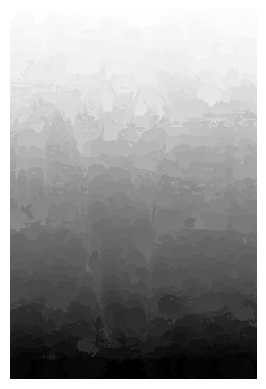

55075_75.jpg, 5D, r=12, c=4
Clusters found: 938


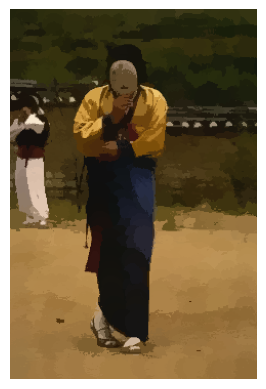

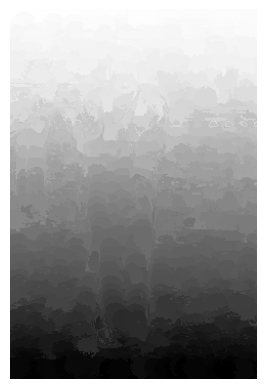

55075_75.jpg, 5D, r=12, c=5
Clusters found: 951


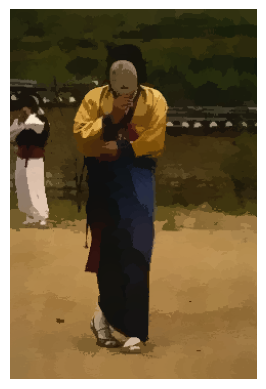

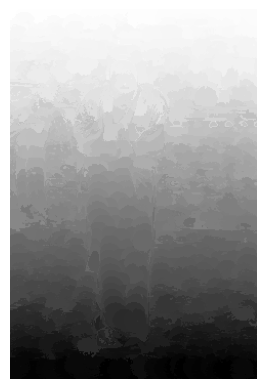

55075_75.jpg, 5D, r=16, c=2
Clusters found: 403


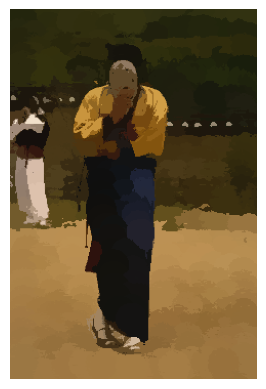

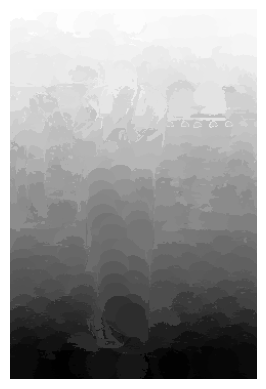

55075_75.jpg, 5D, r=16, c=3
Clusters found: 431


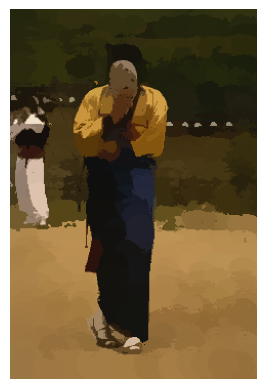

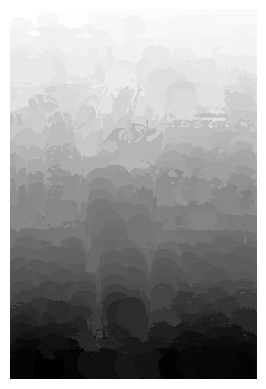

55075_75.jpg, 5D, r=16, c=4
Clusters found: 452


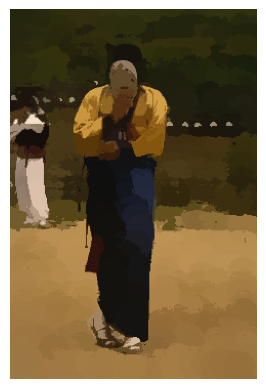

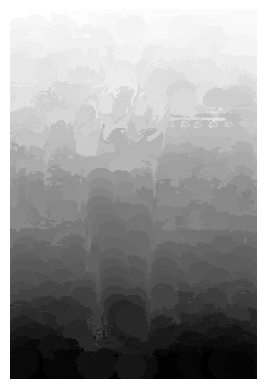

55075_75.jpg, 5D, r=16, c=5
Clusters found: 451


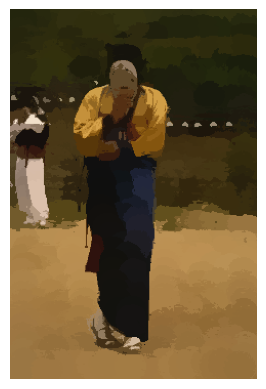

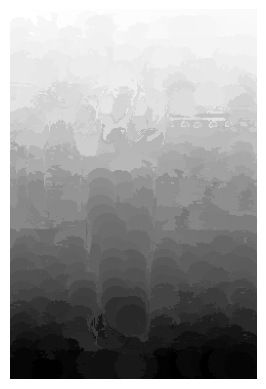

55075_75.jpg, 5D, r=24, c=2
Clusters found: 151


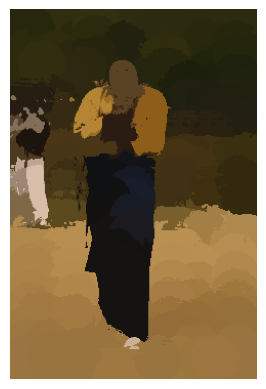

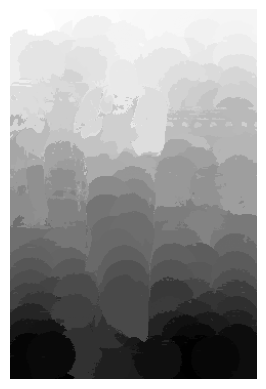

55075_75.jpg, 5D, r=24, c=3
Clusters found: 163


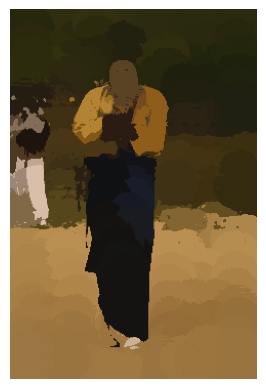

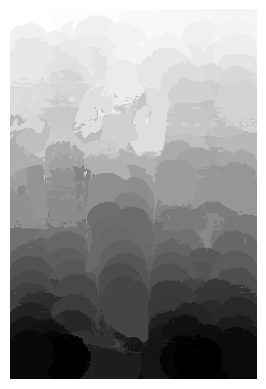

55075_75.jpg, 5D, r=24, c=4
Clusters found: 168


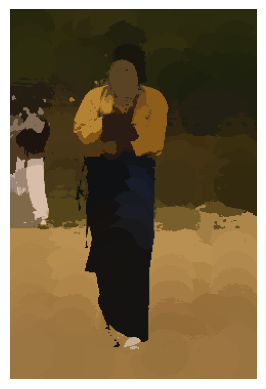

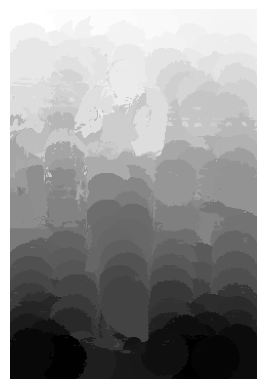

55075_75.jpg, 5D, r=24, c=5
Clusters found: 168


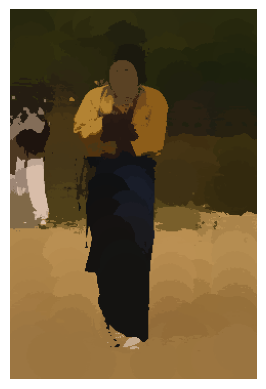

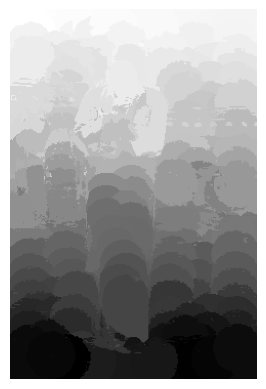

181091_75.jpg, 5D, r=8, c=2
Clusters found: 3399


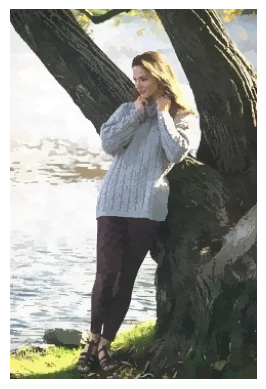

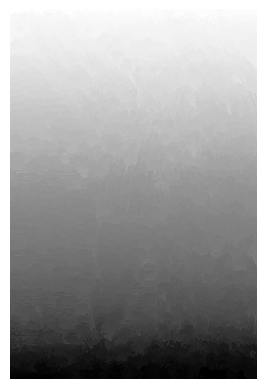

181091_75.jpg, 5D, r=8, c=3
Clusters found: 3503


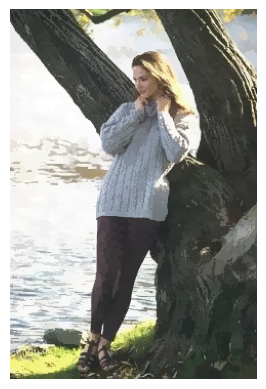

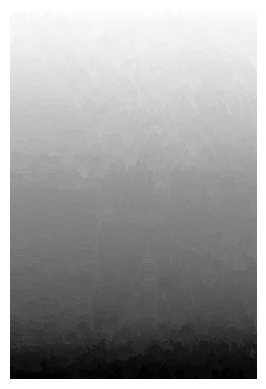

181091_75.jpg, 5D, r=8, c=4
Clusters found: 3546


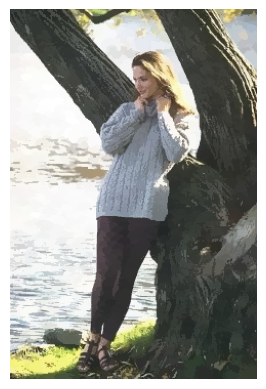

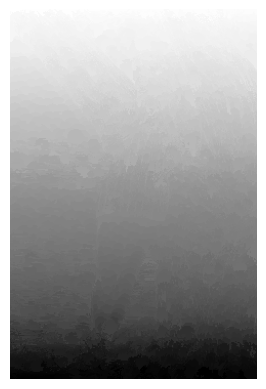

181091_75.jpg, 5D, r=8, c=5
Clusters found: 3563


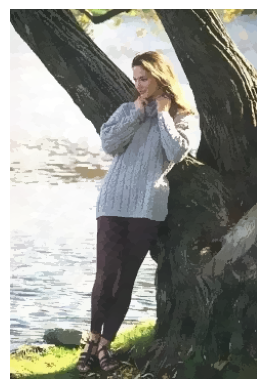

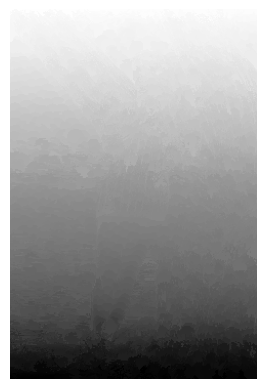

181091_75.jpg, 5D, r=12, c=2
Clusters found: 1089


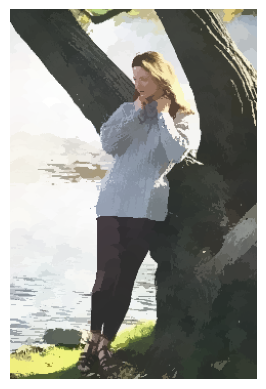

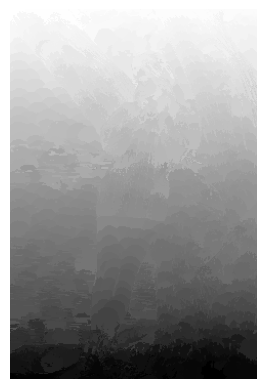

181091_75.jpg, 5D, r=12, c=3
Clusters found: 1128


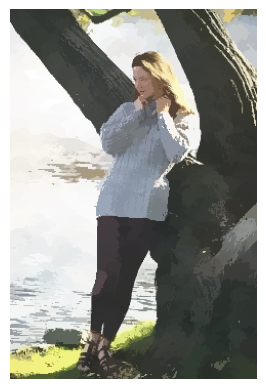

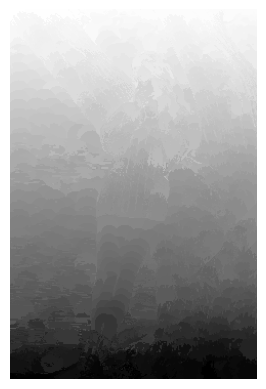

181091_75.jpg, 5D, r=12, c=4
Clusters found: 1165


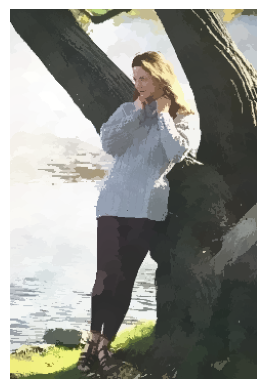

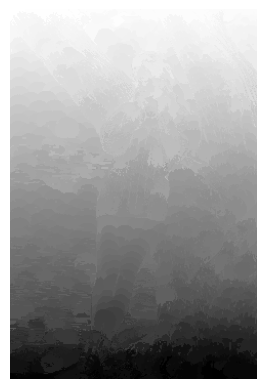

181091_75.jpg, 5D, r=12, c=5
Clusters found: 1174


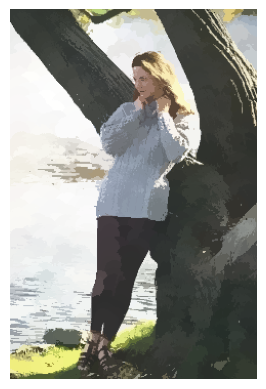

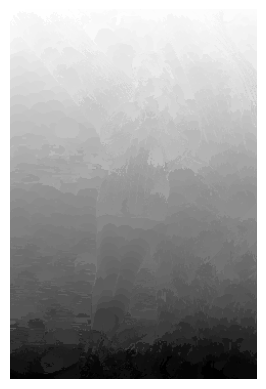

181091_75.jpg, 5D, r=16, c=2
Clusters found: 462


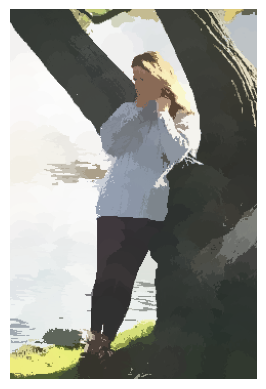

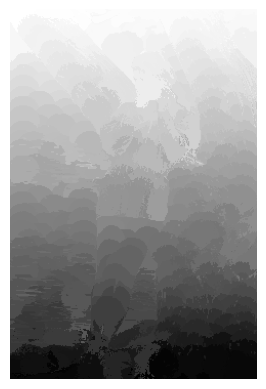

181091_75.jpg, 5D, r=16, c=3
Clusters found: 493


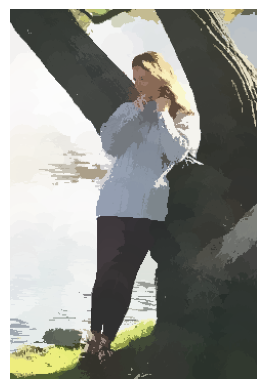

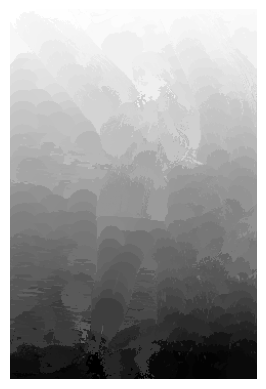

181091_75.jpg, 5D, r=16, c=4
Clusters found: 501


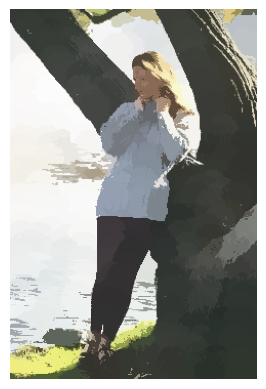

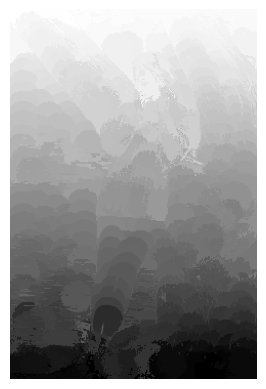

181091_75.jpg, 5D, r=16, c=5
Clusters found: 511


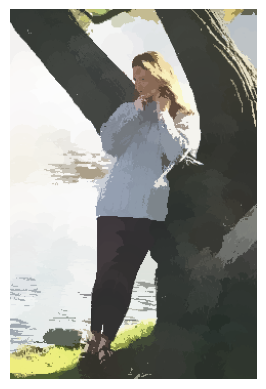

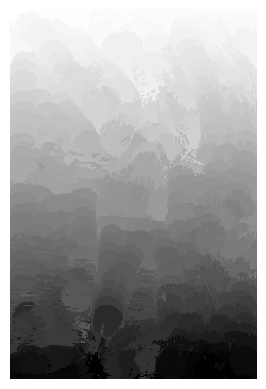

181091_75.jpg, 5D, r=24, c=2
Clusters found: 149


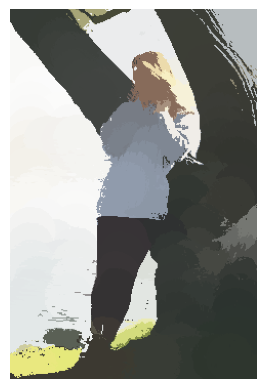

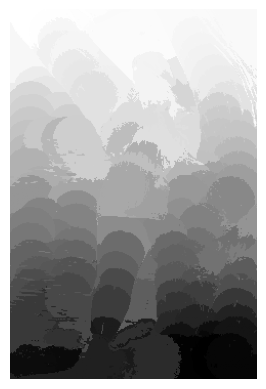

181091_75.jpg, 5D, r=24, c=3
Clusters found: 152


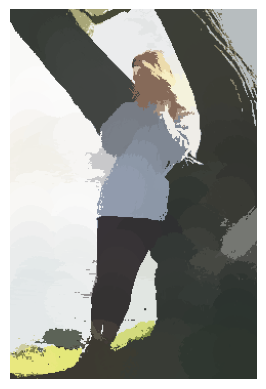

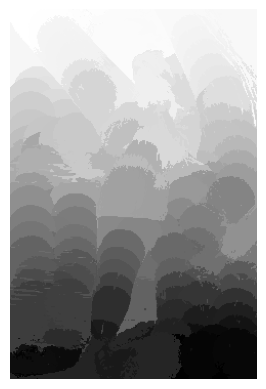

181091_75.jpg, 5D, r=24, c=4
Clusters found: 158


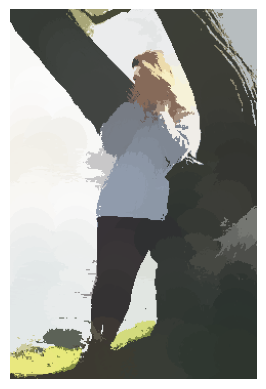

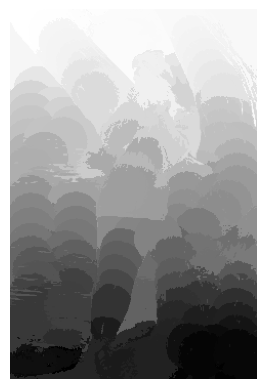

181091_75.jpg, 5D, r=24, c=5
Clusters found: 161


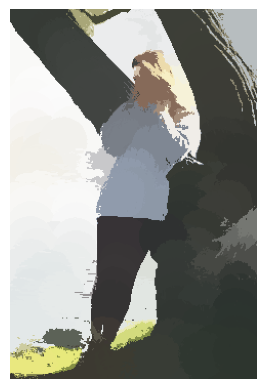

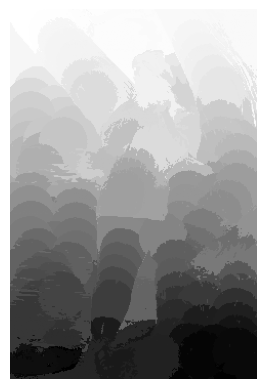

368078_75.jpg, 5D, r=8, c=2
Clusters found: 4281


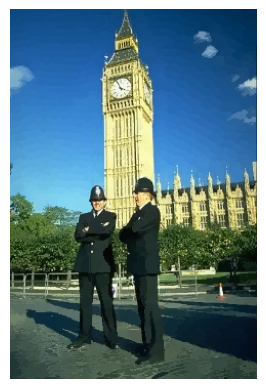

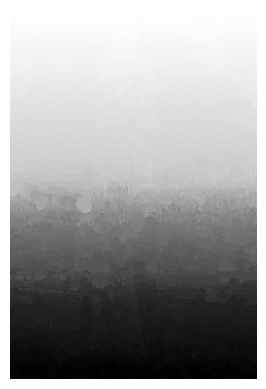

368078_75.jpg, 5D, r=8, c=3
Clusters found: 4339


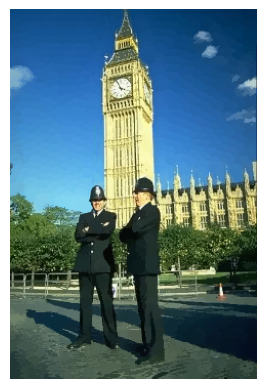

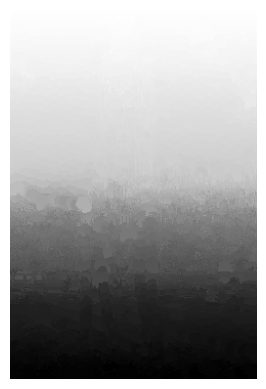

368078_75.jpg, 5D, r=8, c=4
Clusters found: 4372


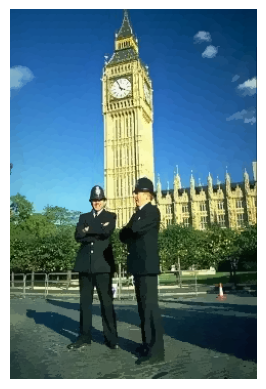

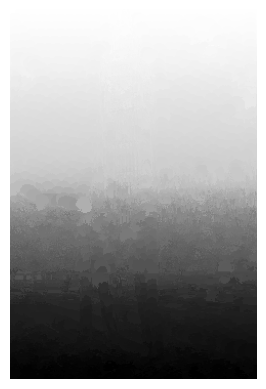

368078_75.jpg, 5D, r=8, c=5
Clusters found: 4383


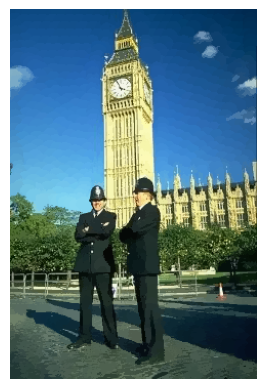

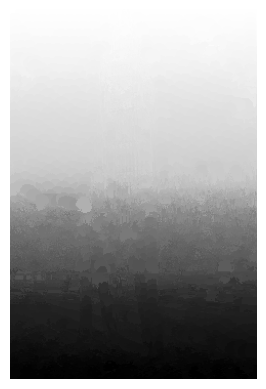

368078_75.jpg, 5D, r=12, c=2
Clusters found: 1294


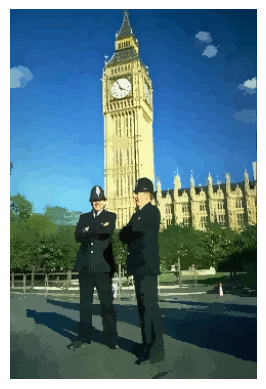

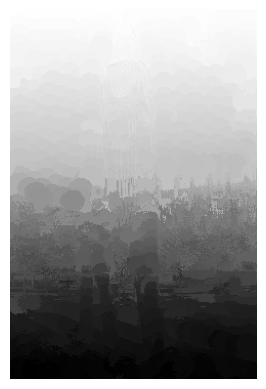

368078_75.jpg, 5D, r=12, c=3
Clusters found: 1354


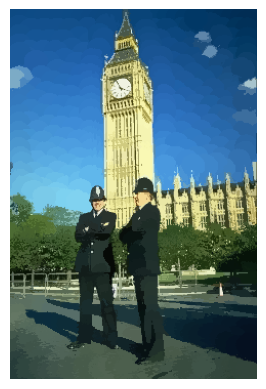

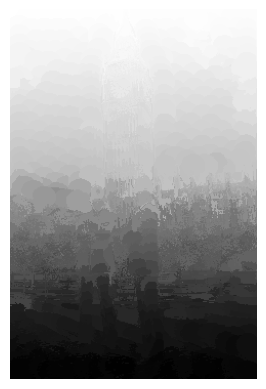

368078_75.jpg, 5D, r=12, c=4
Clusters found: 1374


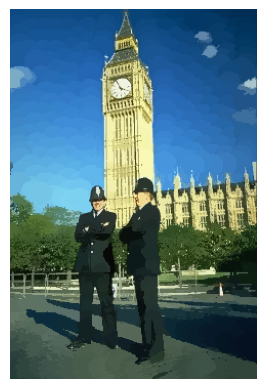

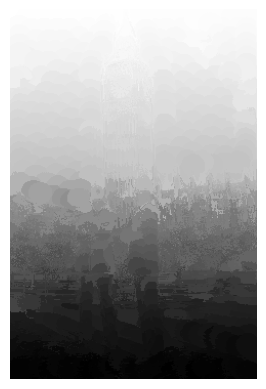

368078_75.jpg, 5D, r=12, c=5
Clusters found: 1397


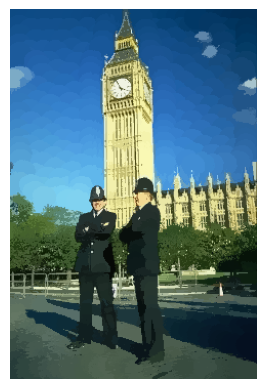

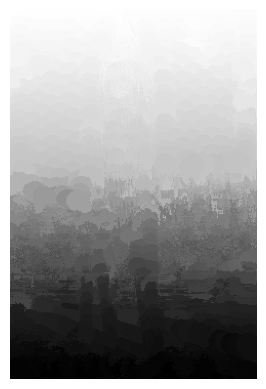

368078_75.jpg, 5D, r=16, c=2
Clusters found: 527


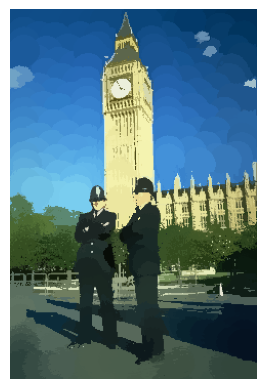

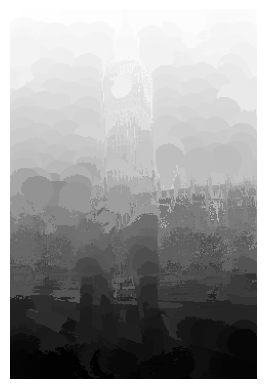

368078_75.jpg, 5D, r=16, c=3
Clusters found: 551


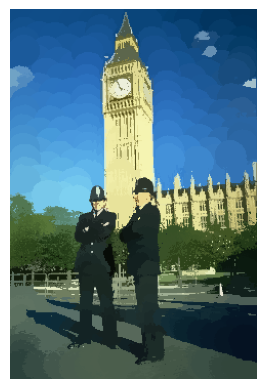

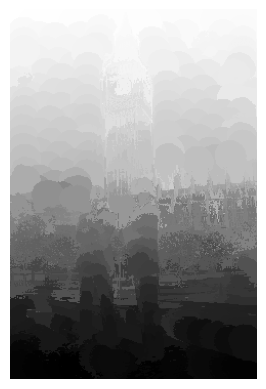

368078_75.jpg, 5D, r=16, c=4
Clusters found: 572


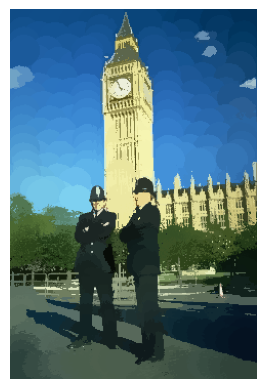

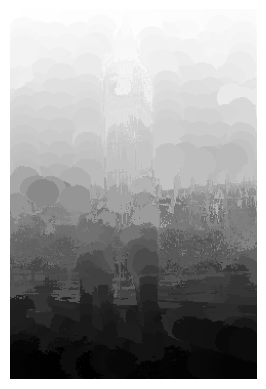

368078_75.jpg, 5D, r=16, c=5
Clusters found: 584


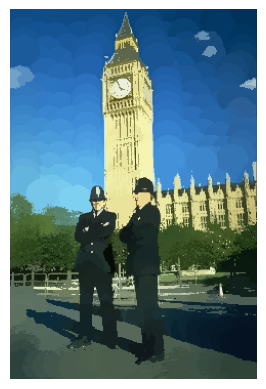

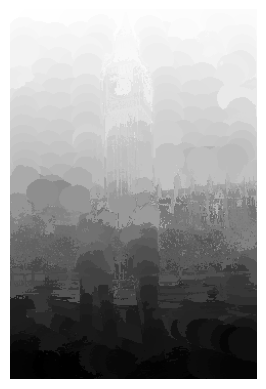

368078_75.jpg, 5D, r=24, c=2
Clusters found: 141


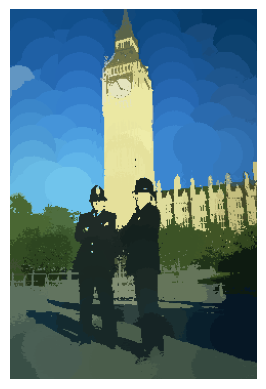

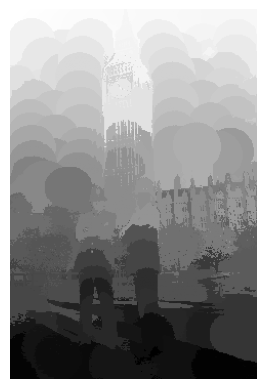

368078_75.jpg, 5D, r=24, c=3
Clusters found: 156


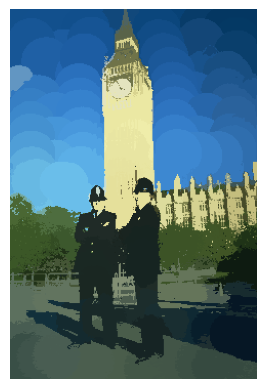

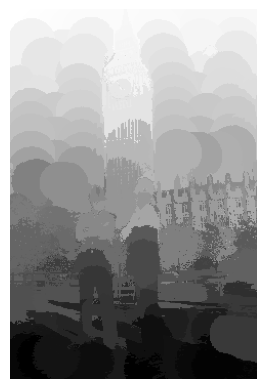

368078_75.jpg, 5D, r=24, c=4
Clusters found: 160


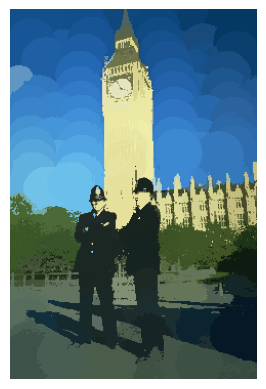

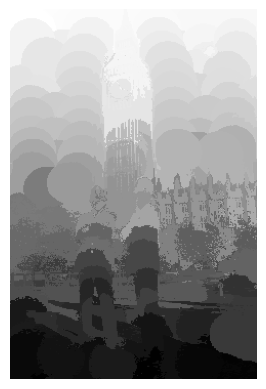

368078_75.jpg, 5D, r=24, c=5
Clusters found: 165


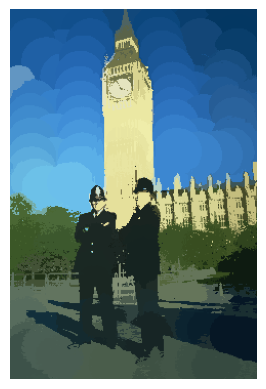

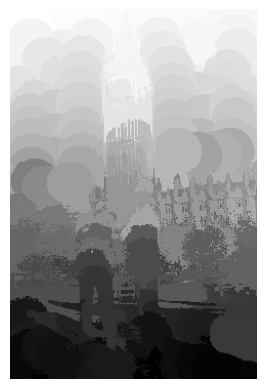

In [36]:
for image in IMAGES:
    for r in R:
        for c in C:
            print(f"{image}, 5D, r={r}, c={c}")
            path = "images/" + image
            h, w, _ = load_image_lab(path).shape
            labels = results_5d[image][r][c]["labels"]
            peaks = results_5d[image][r][c]["peaks"]
            print("Clusters found:", len(peaks))

            # Plot and save peaks
            filename_peaks = f"results/segmented_images/{image}_5D_r={r}_c={c}.jpg"
            segm_image_peaks((h, w), labels, peaks, save_as=filename_peaks)

            # Plot and save clusters
            filename_clusters = (
                f"results/segmented_images/{image}_5D_clusters_r={r}_c={c}.jpg"
            )
            segm_image_clusters((h, w), labels, peaks, save_as=filename_clusters)

Plot number of clusters found and total time against different values of r, c


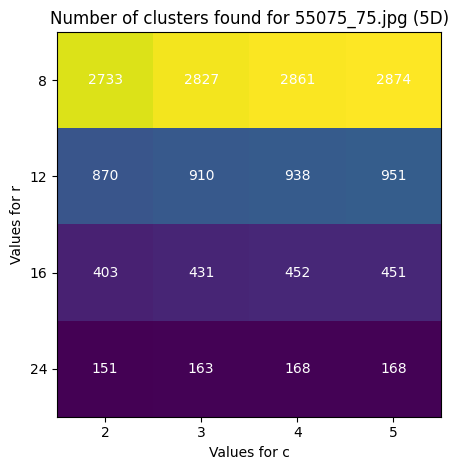

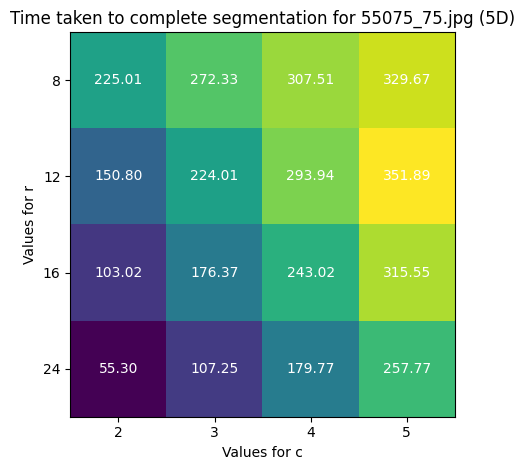

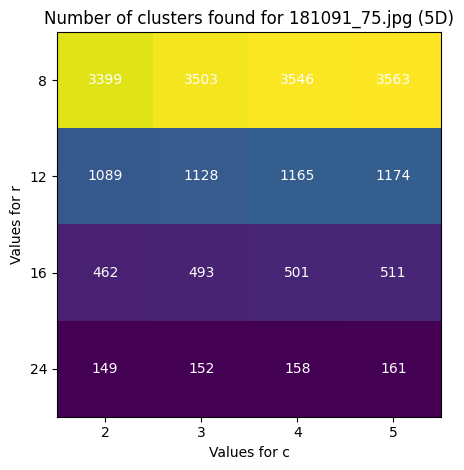

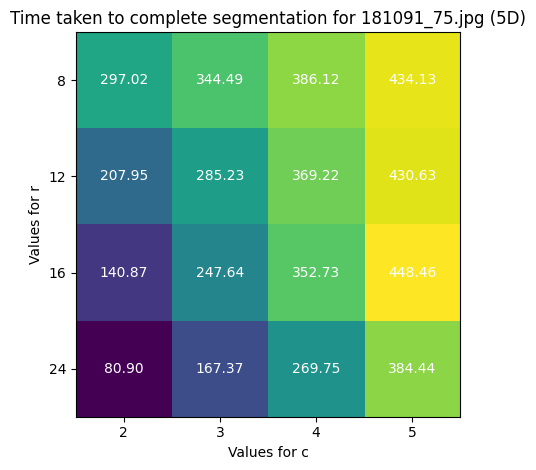

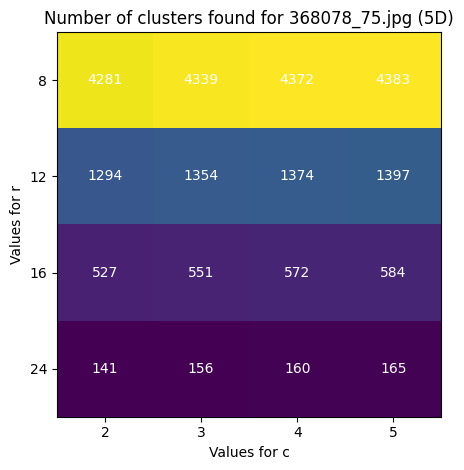

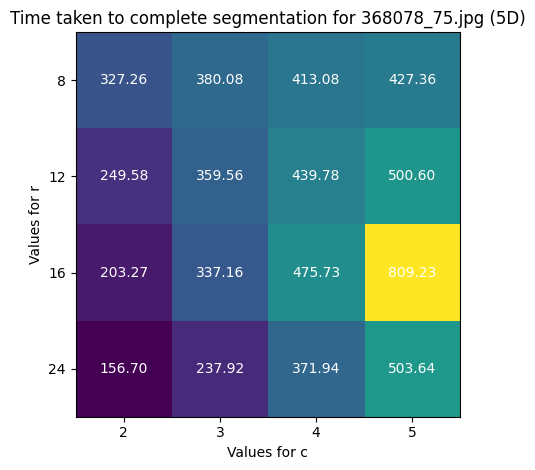

In [41]:
for image in IMAGES:
    heatmap_clusters_num(
        results_5d, image, "5D", save_as=f"results/heatmaps/{image}_5D_clusters_num.jpg"
    )
    heatmap_time(
        results_5d, image, "5D", save_as=f"results/heatmaps/{image}_5D_time.jpg"
    )